<a href="https://colab.research.google.com/github/Thomas-Fabbris/applied-statistics-polimi/blob/main/Labs/Lab_III_2026_TBC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**<font size="5">Applied Statistics</font>**

<font size="3">MSc in High Performance Computing Engineering, Computer Science and Engineering, Physics Engineering, ... cod 062102</font>

A.Y. 2025-2026

Prof. Michela Carlotta Massi - Dott. Vittorio Torri

---

<font size="4">**Lab 3 - Hierarchical clustering & K-Means**</font>

# Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage, cut_tree, cophenet, fcluster
from scipy.spatial.distance import pdist, squareform, cdist
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D  # for 3D plots
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore")

In [ ]:
np.random.seed(123)

# Hierarchical Clustering

## Iris dataset

### Load and plot

In [2]:
from sklearn.datasets import load_iris
iris_data = load_iris()
print(iris_data.DESCR)

.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

:Number of Instances: 150 (50 in each of three classes)
:Number of Attributes: 4 numeric, predictive attributes and the class
:Attribute Information:
    - sepal length in cm
    - sepal width in cm
    - petal length in cm
    - petal width in cm
    - class:
            - Iris-Setosa
            - Iris-Versicolour
            - Iris-Virginica

:Summary Statistics:

============== ==== ==== ======= ===== ====================
                Min  Max   Mean    SD   Class Correlation
============== ==== ==== ======= ===== ====================
sepal length:   4.3  7.9   5.84   0.83    0.7826
sepal width:    2.0  4.4   3.05   0.43   -0.4194
petal length:   1.0  6.9   3.76   1.76    0.9490  (high!)
petal width:    0.1  2.5   1.20   0.76    0.9565  (high!)
============== ==== ==== ======= ===== ====================

:Missing Attribute Values: None
:Class Distribution: 33.3% for each of 3 classes.
:Cr

In [3]:
iris_data

{'data': array([[5.1, 3.5, 1.4, 0.2],
        [4.9, 3. , 1.4, 0.2],
        [4.7, 3.2, 1.3, 0.2],
        [4.6, 3.1, 1.5, 0.2],
        [5. , 3.6, 1.4, 0.2],
        [5.4, 3.9, 1.7, 0.4],
        [4.6, 3.4, 1.4, 0.3],
        [5. , 3.4, 1.5, 0.2],
        [4.4, 2.9, 1.4, 0.2],
        [4.9, 3.1, 1.5, 0.1],
        [5.4, 3.7, 1.5, 0.2],
        [4.8, 3.4, 1.6, 0.2],
        [4.8, 3. , 1.4, 0.1],
        [4.3, 3. , 1.1, 0.1],
        [5.8, 4. , 1.2, 0.2],
        [5.7, 4.4, 1.5, 0.4],
        [5.4, 3.9, 1.3, 0.4],
        [5.1, 3.5, 1.4, 0.3],
        [5.7, 3.8, 1.7, 0.3],
        [5.1, 3.8, 1.5, 0.3],
        [5.4, 3.4, 1.7, 0.2],
        [5.1, 3.7, 1.5, 0.4],
        [4.6, 3.6, 1. , 0.2],
        [5.1, 3.3, 1.7, 0.5],
        [4.8, 3.4, 1.9, 0.2],
        [5. , 3. , 1.6, 0.2],
        [5. , 3.4, 1.6, 0.4],
        [5.2, 3.5, 1.5, 0.2],
        [5.2, 3.4, 1.4, 0.2],
        [4.7, 3.2, 1.6, 0.2],
        [4.8, 3.1, 1.6, 0.2],
        [5.4, 3.4, 1.5, 0.4],
        [5.2, 4.1, 1.5, 0.1],
  

In [4]:
iris4 = pd.DataFrame(iris_data.data, columns=iris_data.feature_names)
species_name = iris_data.target
iris = iris4.copy()
iris['target'] = species_name
iris

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


In [5]:
species_name

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

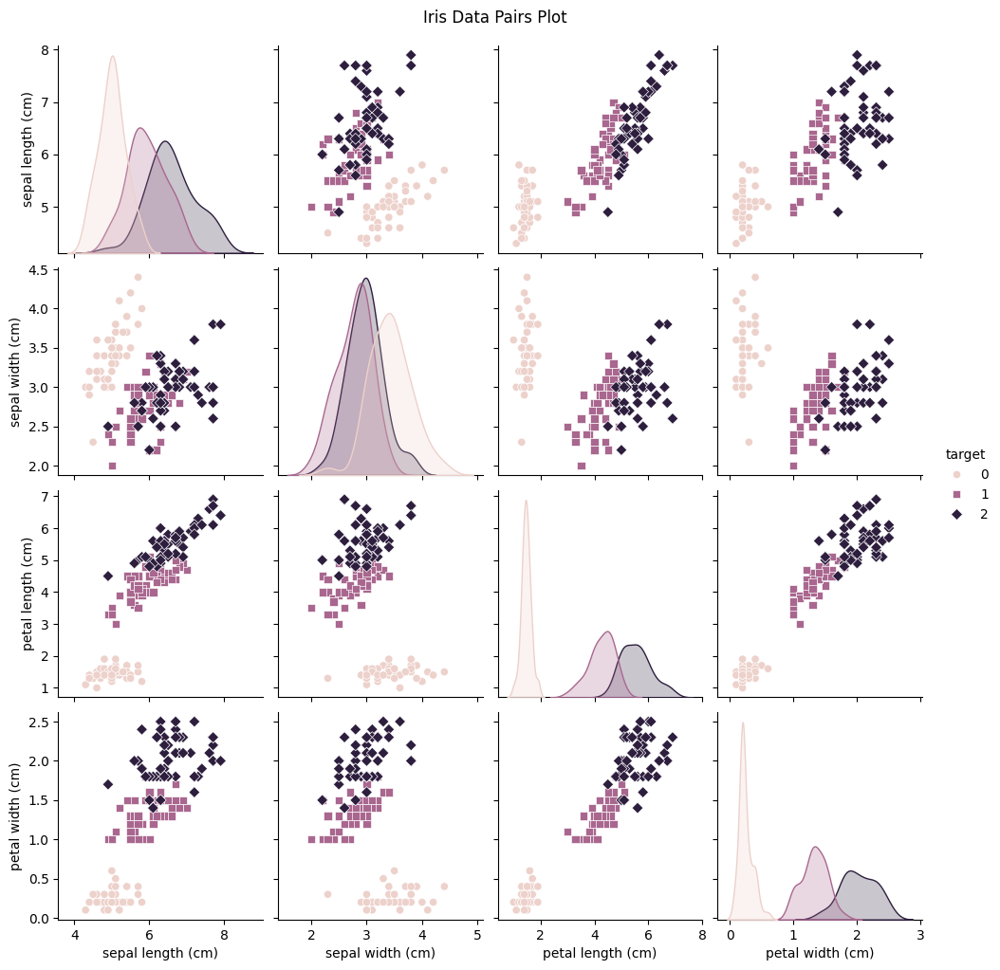

In [ ]:
sns.pairplot(iris, hue="target", diag_kind="kde", markers=["o", "s", "D"]) # Color the plot w.r.t. the target

plt.suptitle("Iris Data Pairs Plot", y=1.02)
plt.show()

For each pair of features, there are almost neatly separated groups corresponding to the three species.

### Distance matrices

Euclidean distance: it is the more natural way to measure distance between points in n-dimensional space.

$$
d_{\text{Euclidean}}(x_i, x_j) = \sqrt{\sum_{k=1}^{p} (x_{ik} - x_{jk})^2}
$$


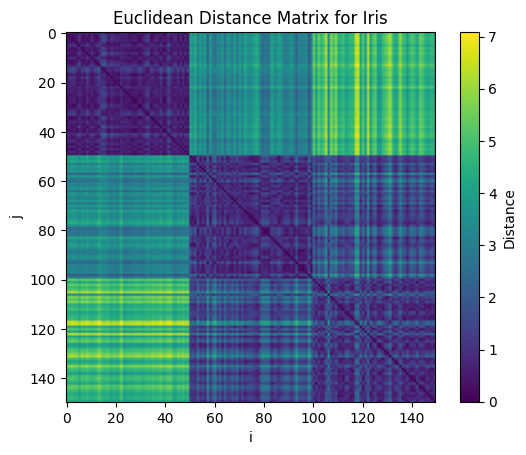

In [7]:
iris_e = pdist(iris4, metric='euclidean') # Built-in scipy function for euclidean distance matrix
im = plt.imshow(squareform(iris_e), aspect='equal')
plt.title("Euclidean Distance Matrix for Iris")
plt.xlabel("i")
plt.ylabel("j")

plt.colorbar(im, label="Distance")

plt.show()

Here the distance matrix is showed using colors, instead of showing a miryad of numbers. Only the distances between the first and the third group are high, whereas the situation between the second and the third group is more blurred.

Other metrics: Manhattan and Canberra

$$
d_{\text{Manhattan}}(x_i, x_j) = \sum_{k=1}^{p} |x_{ik} - x_{jk}|
$$

$$
d_{\text{Canberra}}(x_i, x_j) = \sum_{k=1}^{p} \frac{|x_{ik} - x_{jk}|}{|x_{ik}| + |x_{jk}|}
$$

Euclidean distance is misleading in a very high-dimensional subspace where all points are sparse; moreover, it is very sensitive to outliers.

In Camberra distance, all features are treated in the same way while computing the distance, differently from Manhattan and Euclidean distances. Its effect of normalising features is not desirable in a dataset characterized by an high variability, where each feature has its own significance.

Manhattan distance is less sensitive to high-dimensionality than Euclidean distance (L2 norm) and less sensitive to outliers.

The fraction in Canberra distance magnifies the impact of small differences when absolute values are small

In general, the three distance matrixes will have their own scale but in order to compare them, we need to set the minimum and maximum values in the matrix.


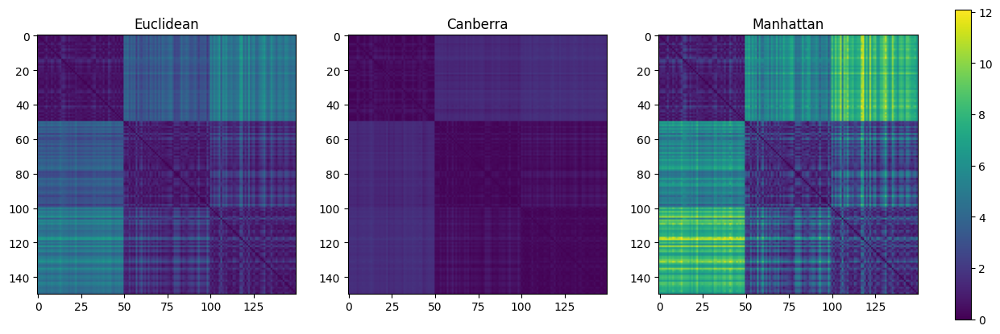

In [8]:
iris_m = pdist(iris4, metric='cityblock')
iris_c = pdist(iris4, metric='canberra')

# Compute the minimum and maximum across distances to scale plots in the same way
vmin = min(iris_e.min(), iris_c.min(), iris_m.min())
vmax = max(iris_e.max(), iris_c.max(), iris_m.max())

fig, axs = plt.subplots(1, 3, figsize=(15,5))

im0 = axs[0].imshow(squareform(iris_e), vmin=vmin, vmax=vmax, aspect='equal')
axs[0].set_title("Euclidean")

im1 = axs[1].imshow(squareform(iris_c), vmin=vmin, vmax=vmax, aspect='equal')
axs[1].set_title("Canberra")

im2 = axs[2].imshow(squareform(iris_m), vmin=vmin, vmax=vmax, aspect='equal')
axs[2].set_title("Manhattan")

fig.colorbar(im2, ax=axs, orientation='vertical', fraction=0.02, pad=0.04)

plt.show()

But the data might not be ordered according to labels and we cannot always identify a target variable. Let's shuffle them:

In [9]:
np.random.seed(42)
iris = iris.sample(frac=1)
iris4 = iris.drop('target', axis=1)

In [10]:
iris

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
73,6.1,2.8,4.7,1.2,1
18,5.7,3.8,1.7,0.3,0
118,7.7,2.6,6.9,2.3,2
78,6.0,2.9,4.5,1.5,1
76,6.8,2.8,4.8,1.4,1
...,...,...,...,...,...
71,6.1,2.8,4.0,1.3,1
106,4.9,2.5,4.5,1.7,2
14,5.8,4.0,1.2,0.2,0
92,5.8,2.6,4.0,1.2,1


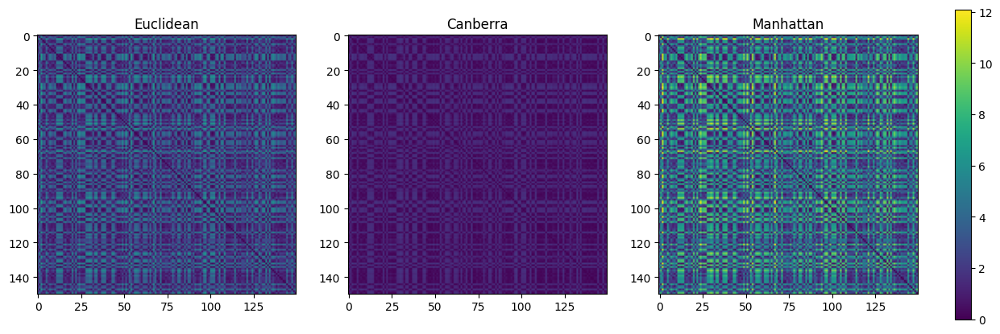

In [11]:
iris_e = pdist(iris4, metric='euclidean')
iris_m = pdist(iris4, metric='cityblock')
iris_c = pdist(iris4, metric='canberra')

fig, axs = plt.subplots(1, 3, figsize=(15,5))
im0 = axs[0].imshow(squareform(iris_e), vmin=vmin, vmax=vmax, aspect='equal')
axs[0].set_title("Euclidean")

im1 = axs[1].imshow(squareform(iris_c), vmin=vmin, vmax=vmax, aspect='equal')
axs[1].set_title("Canberra")

im2 = axs[2].imshow(squareform(iris_m), vmin=vmin, vmax=vmax, aspect='equal')
axs[2].set_title("Manhattan")

fig.colorbar(im2, ax=axs, orientation='vertical', fraction=0.02, pad=0.04)
plt.show()

### Hierarchical clustering

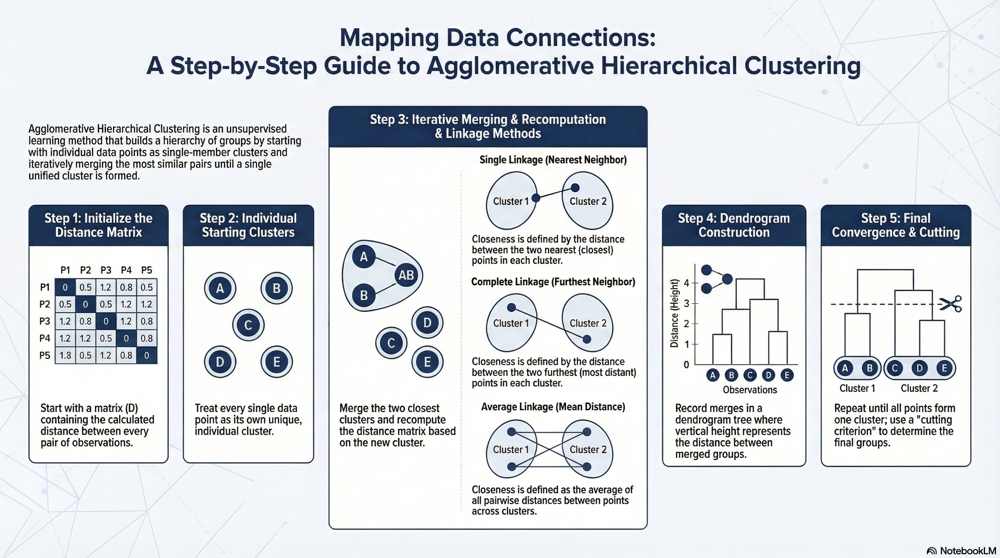

Let's try to cluster these data with **agglomerative hierarchical clustering**!  
The output of the clustering algorithm is set of n possible partitions for the dataset.

Single linkage tends to form long, chain-like clusters. Works well for data where clusters are naturally spread out .

Complete linkage ensures clusters are tight and well-defined, finding more easily spherical clusters and naturally resisting outliers. Might over-fragment data when clusters have a natural spread.

Average linkage is less sensitive to outliers compared to single linkage but more flexible than complete linkage.

We experiment with the three different linkages:

In [12]:
iris_es = linkage(iris_e, method='single')
iris_ea = linkage(iris_e, method='average')
iris_ec = linkage(iris_e, method='complete')

In [13]:
iris_es

array([[4.00000000e+01, 7.30000000e+01, 0.00000000e+00, 2.00000000e+00],
       [6.50000000e+01, 8.70000000e+01, 1.00000000e-01, 2.00000000e+00],
       [5.30000000e+01, 1.01000000e+02, 1.00000000e-01, 2.00000000e+00],
       [1.30000000e+01, 8.50000000e+01, 1.00000000e-01, 2.00000000e+00],
       [1.90000000e+01, 2.30000000e+01, 1.00000000e-01, 2.00000000e+00],
       [4.40000000e+01, 1.24000000e+02, 1.00000000e-01, 2.00000000e+00],
       [5.70000000e+01, 1.52000000e+02, 1.41421356e-01, 3.00000000e+00],
       [3.80000000e+01, 1.32000000e+02, 1.41421356e-01, 2.00000000e+00],
       [1.40000000e+01, 1.28000000e+02, 1.41421356e-01, 2.00000000e+00],
       [4.50000000e+01, 8.30000000e+01, 1.41421356e-01, 2.00000000e+00],
       [4.70000000e+01, 1.39000000e+02, 1.41421356e-01, 2.00000000e+00],
       [7.90000000e+01, 1.29000000e+02, 1.41421356e-01, 2.00000000e+00],
       [1.56000000e+02, 1.57000000e+02, 1.41421356e-01, 5.00000000e+00],
       [2.00000000e+01, 2.90000000e+01, 1.41421356e

The linkage method returns the dendograms, let's plot them:

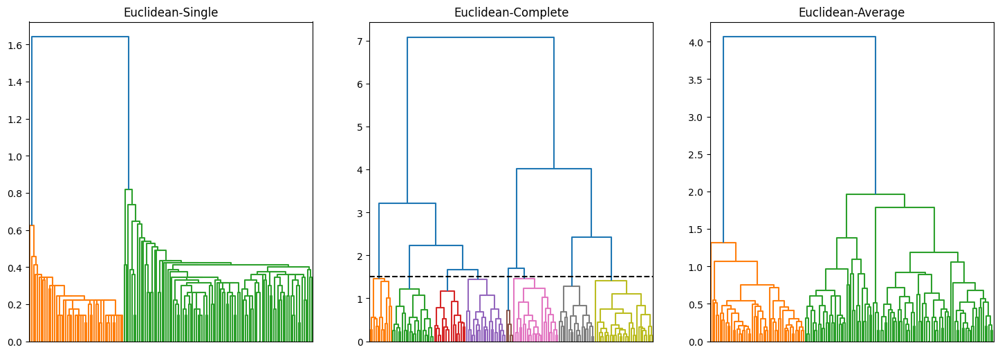

In [15]:
fig, axs = plt.subplots(1, 3, figsize=(18,6))
dendrogram(iris_es, ax=axs[0], no_labels=True) # hides record labels (ids) on x axis
axs[0].set_title("Euclidean-Single")
dendrogram(iris_ec, ax=axs[1], no_labels=True, color_threshold=1.5) # Draw a horizontal cut at height = 1.5 and color clusters accordingly
axs[1].axhline(y=1.5, color='black', linestyle='--', linewidth=1.5)
axs[1].set_title("Euclidean-Complete")
dendrogram(iris_ea, ax=axs[2], no_labels=True)
axs[2].set_title("Euclidean-Average")
plt.show()

Labels on the dendogram is useful only when working with a small dataset.  
In principle, the dendogram does not have any color, but they come from setting a color threshold (user-defined in the second case and automatically inferred by scipy in the first and third case).  
Euclidean-Single returns a pretty good clustering, with two distinct groups, whereas the result returned by Euclidean-Average is more suspect.  
By using single-linkage, we expect smaller distances between clusters, whereas complete-linkage is affected by outliers and tends to return a higher number of clusters.  
Of course, it is not meaningful to cut the dendogram at the beginning because we'd have a single big cluster.

From the documentation of the scipy dendogram function:

```
   For brevity, let t  be the color_threshold. Colors all the descendent links below a cluster node the same color if is the first node below the cut threshold t.
   All links connecting nodes with distances greater than or equal to the threshold are colored with the default matplotlib color 'C0'.
   If t is less than or equal to zero, all nodes are colored 'C0'. If color_threshold is None or ‘default’, corresponding with MATLAB(TM) behavior, the threshold is set to 0.7*max(Z[:,2]).
```



What if we want to cut the dendrograms into k=2 clusters?

In [17]:
k=2

cluster_ec = cut_tree(iris_ec, n_clusters=k).flatten()
cluster_es = cut_tree(iris_es, n_clusters=k).flatten()
cluster_ea = cut_tree(iris_ea, n_clusters=k).flatten()

In [18]:
cluster_ec

array([0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0,
       1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0])

### Cluster interpretation

The first thing to do is building a contingency table against a particular target column.
Euclidean-single puts species 1 and 2 in the same cluster,0, whereas the other one is put in cluster 1.

In [19]:
print("Contingency table for Euclidean-Single:")
print(pd.crosstab(iris.target, cluster_es))
print("\n\nContingency table for Euclidean-Complete:")
print(pd.crosstab(iris.target, cluster_ec))
print("\n\nContingency table for Euclidean-Average:")
print(pd.crosstab(iris.target, cluster_ea))

Contingency table for Euclidean-Single:
col_0    0   1
target        
0        0  50
1       50   0
2       50   0


Contingency table for Euclidean-Complete:
col_0    0   1
target        
0        0  50
1       23  27
2       49   1


Contingency table for Euclidean-Average:
col_0    0   1
target        
0        0  50
1       50   0
2       50   0


Fix k=2 clusters

In [20]:
cluster_ec = cut_tree(iris_ec, n_clusters=2).flatten()
cluster_es = cut_tree(iris_es, n_clusters=2).flatten()
cluster_ea = cut_tree(iris_ea, n_clusters=2).flatten()

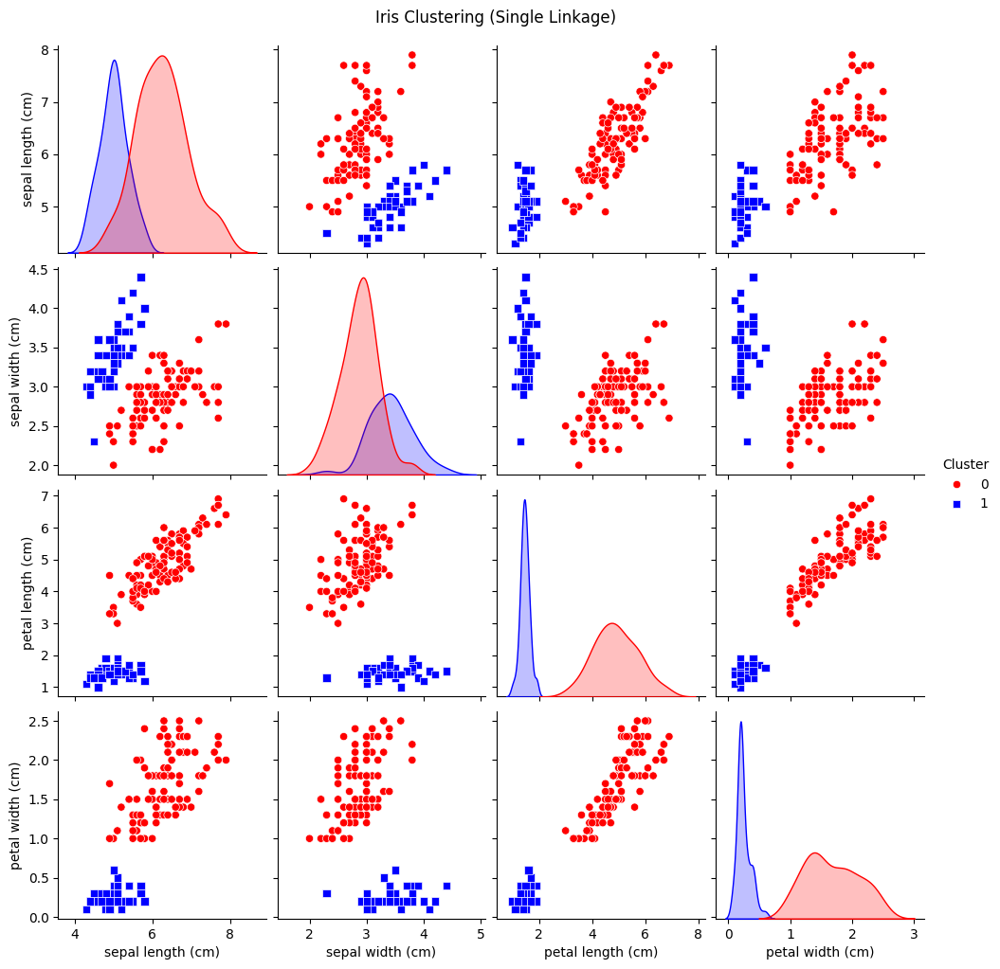

In [21]:
iris4['Cluster'] = cluster_es
palette = {0: 'red', 1: 'blue'}
sns.pairplot(iris4, hue="Cluster", palette=palette, markers=["o", "s"])
plt.suptitle("Iris Clustering (Single Linkage)", y=1.02)
plt.show()

From every perspective, clustering proposed by Euclidean-single is meaningful

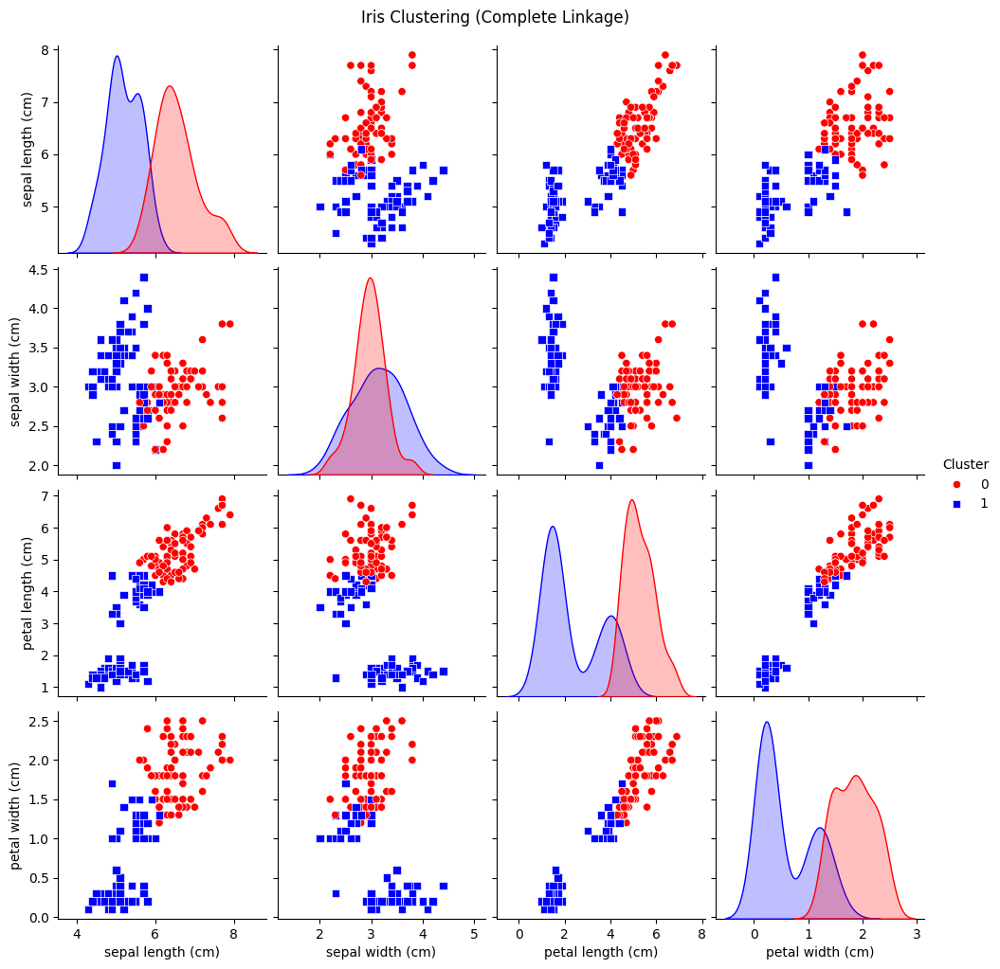

In [22]:
iris4['Cluster'] = cluster_ec
palette = {0: 'red', 1: 'blue'}
sns.pairplot(iris4, hue="Cluster", palette=palette, markers=["o", "s"])
plt.suptitle("Iris Clustering (Complete Linkage)", y=1.02)
plt.show()

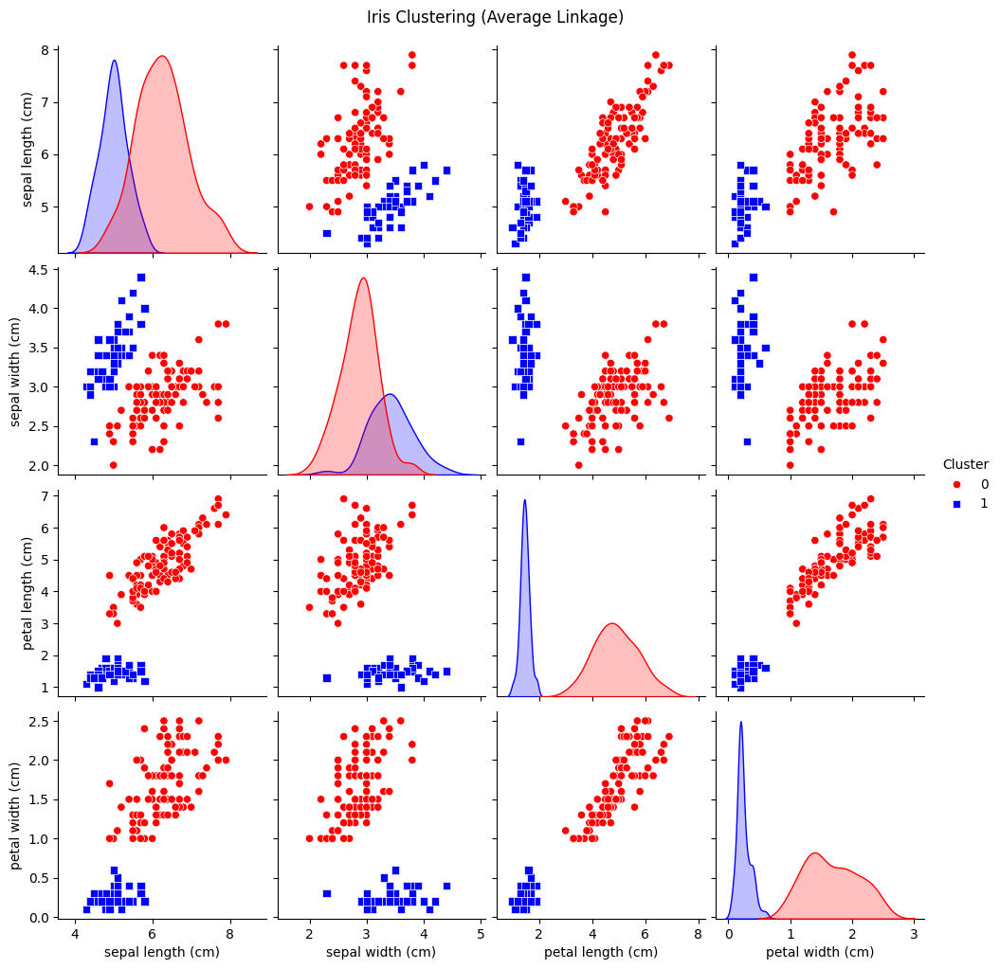

In [23]:
iris4['Cluster'] = cluster_ea
palette = {0: 'red', 1: 'blue'}
sns.pairplot(iris4, hue="Cluster", palette=palette, markers=["o", "s"])
plt.suptitle("Iris Clustering (Average Linkage)", y=1.02)
plt.show()

### Cluster evaluation (CCC, WSS, BSS)

The **cophenetic distance** between two points in a hierarchical clustering tree (dendrogram) is the height at which they are merged into the same cluster.

The **cophenetic correlation coefficient** measures how well the hierarchical clustering structure preserves the original pairwise distances, computing the correlation between $D$ and $C$

$$
CCC = \frac{\sum (d_{ij} - \bar{d})(c_{ij} - \bar{c})}{\sqrt{\sum (d_{ij} - \bar{d})^2 \sum (c_{ij} - \bar{c})^2}}
$$


with $d_{ij}$ original distances and $c_{ij}$ cophenetic distances.  
CCC can be applied only to hierarchical clustering algorithm because of the way it is defined as the correlation between cophenetic distance matrix and original distance matrix.

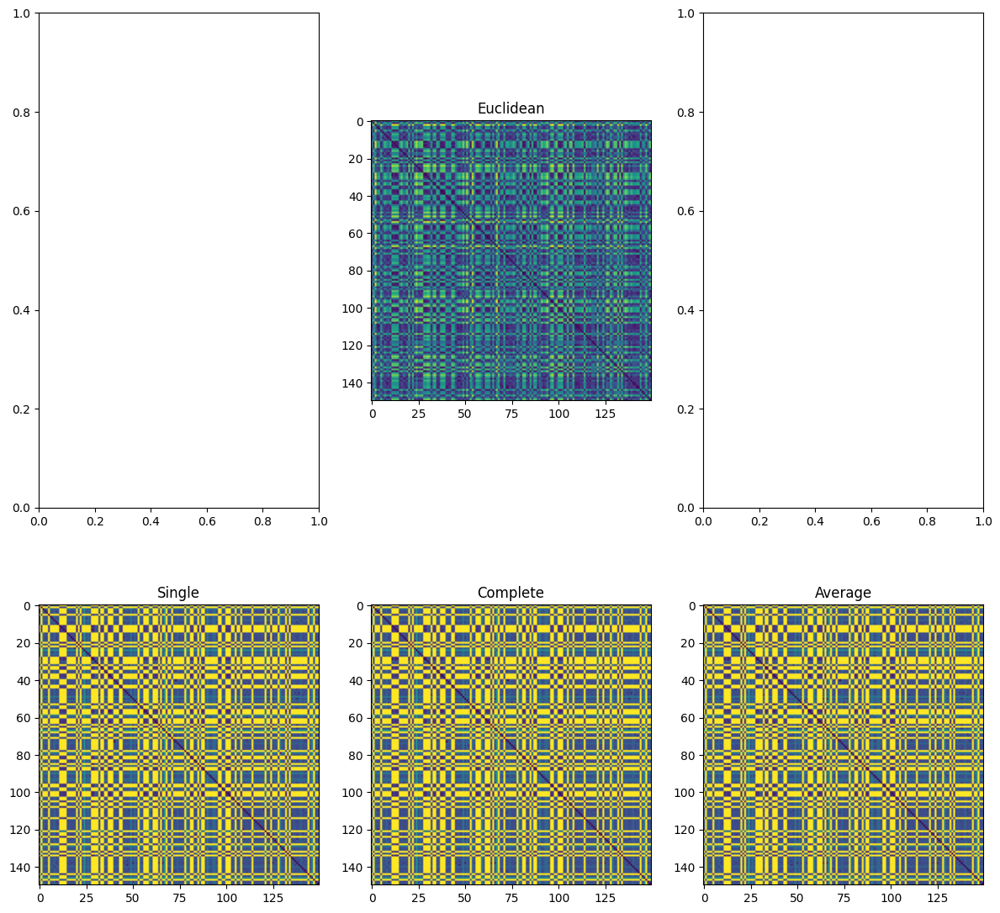

In [24]:
# Compute cophenetic coefficients and cophenetic distances
coph_es, coph_dists_es = cophenet(iris_es, iris_e)
coph_ec, coph_dists_ec = cophenet(iris_ec, iris_e)
coph_ea, coph_dists_ea = cophenet(iris_ea, iris_e)

fig, axs = plt.subplots(2, 3, figsize=(12,12))
axs[0,1].imshow(squareform(iris_e), aspect='equal')
axs[0,1].set_title("Euclidean")
axs[1,0].imshow(squareform(coph_dists_es), aspect='equal')
axs[1,0].set_title("Single")
axs[1,1].imshow(squareform(coph_dists_es), aspect='equal')
axs[1,1].set_title("Complete")
axs[1,2].imshow(squareform(coph_dists_es), aspect='equal')
axs[1,2].set_title("Average")
plt.tight_layout()
plt.show()

By visualing look at these matrixes, it is hard to propose a good interpretation, so computing CCC becomes handy.  
Generally speaking, $CCC \lt 0.5$ denotes a bad clustering whereas the threshold of $CCC$ defining a good-enough clustering depends on the specific dataset (for this dataset, a good CCC would be 0.7)

In [25]:
print("Cophenetic coefficients:")
print({"Eucl-Single": coph_es, "Eucl-Complete": coph_ec, "Eucl-Average": coph_ea})

Cophenetic coefficients:
{'Eucl-Single': np.float64(0.8638786773076584), 'Eucl-Complete': np.float64(0.7276283289028812), 'Eucl-Average': np.float64(0.8769561464741981)}


Internal metrics valid for any clustering algorithm:

$$
WSS = \sum_{k=1}^{K} \sum_{x_i \in C_k} \| x_i - \mu_k \|^2
$$

$$
BSS = \sum_{k=1}^{K} |C_k| \cdot \| \mu_k - \mu \|^2
$$

WSS should be minimized as it is an indicator of the compactness of the clustering (intra-cluster distances), while BSS should be maximized (inter-cluster distances).  
WSS decreases and BSS increases when considering more and more clusters.  
The main objective of the procedure is not to find the minimum value of WSS and the maximum possible value for BSS, but to select a number of cluster after which the variation in WSS and BSS is negligible

In [26]:
def compute_internal_measures(x, merges, k_values):
    wss_values = {}
    bss_values = {}

    overall_mean = np.mean(x, axis=0)  # Compute global mean

    for k in k_values:
        clustering = fcluster(merges, k, criterion='maxclust')
        # computes centroids for all clusters
        centroids = [np.mean(x[clustering==c],axis=0) for c in range(1,k+1)]
        cluster_sizes = [len(x[clustering==c]) for c in range(1,k+1)]
        # computes the euclidean distance between each point and each centroid
        D = cdist(x, centroids, 'euclidean')
        # find nearest centroid for each point
        cIdx = np.argmin(D,axis=1)
        # store the distances to the nearest centroid
        d = np.min(D,axis=1)

        # WSS
        wss = sum(d**2)

        # BSS
        bss = np.sum([size * np.sum((centroid - overall_mean) ** 2) for size, centroid in zip(cluster_sizes, centroids)])

        wss_values[k] = wss
        bss_values[k] = bss
    return wss_values,bss_values

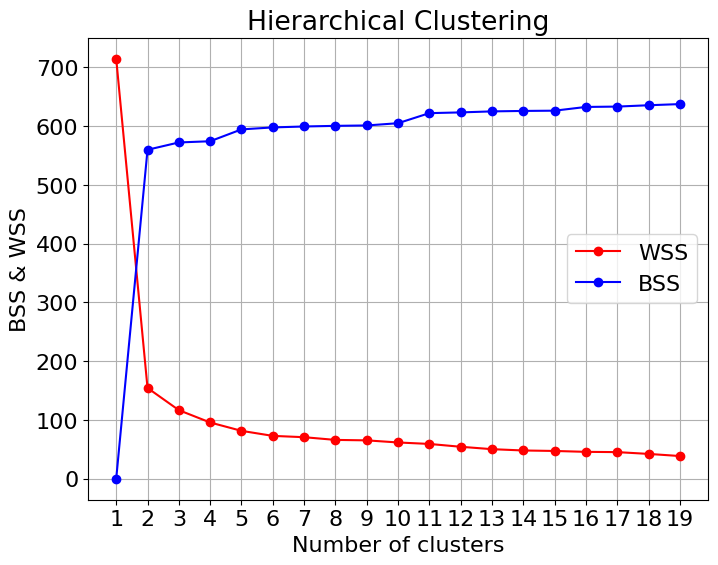

In [27]:
k_values = range(1,20)
wss_dict, bss_dict = compute_internal_measures(iris4, iris_es, k_values)
wss_values = [wss_dict[x] for x in range(1,20)]
bss_values = [bss_dict[x] for x in range(1,20)]
fig = plt.figure(figsize=(8,6))
font = {'family' : 'sans', 'size'   : 16}
plt.rc('font', **font)
plt.plot(k_values, wss_values, 'bo-', color='red', label='WSS')
plt.plot(k_values, bss_values, 'bo-', color='blue', label='BSS')
plt.grid(True)
plt.xlabel('Number of clusters')
plt.ylabel('BSS & WSS')
plt.xticks(k_values)
plt.legend()
plt.title('Hierarchical Clustering');

### Cluster description

We try to understand the cluster, after having studied the optimal number of clusters to form

In [28]:
iris4['Cluster'] = cluster_ea
iris4.groupby('Cluster').describe()

sepal length (cm)                                            \
                    count   mean       std  min  25%  50%  75%  max   
Cluster                                                               
0                   100.0  6.262  0.662834  4.9  5.8  6.3  6.7  7.9   
1                    50.0  5.006  0.352490  4.3  4.8  5.0  5.2  5.8   

        sepal width (cm)         ... petal length (cm)      petal width (cm)  \
                   count   mean  ...               75%  max            count   
Cluster                          ...                                           
0                  100.0  2.872  ...             5.525  6.9            100.0   
1                   50.0  3.428  ...             1.575  1.9             50.0   

                                                   
          mean       std  min  25%  50%  75%  max  
Cluster                                            
0        1.676  0.424769  1.0  1.3  1.6  2.0  2.5  
1        0.246  0.105386  0.1  0.2  0.2  0.3  0.6  

[2 rows x 32 columns]

**Snake plots**

First, the data are normalized (according to the mean and the standard deviation) then we plot each cluster's average normalized values of each attribute.

In [29]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

normalized_iris = scaler.fit_transform(iris4)
df_iris_normalized = pd.DataFrame(normalized_iris,columns=iris4.columns)
df_iris_normalized['Cluster'] = cluster_ea

In [30]:
df_iris_melt = pd.melt(df_iris_normalized,
                    id_vars=['Cluster'],
                    value_vars=iris4.columns,
                    var_name='Attribute',
                    value_name='Value')
df_iris_melt

,Cluster,Attribute,Value
0,0,sepal length (cm),0.310998
1,1,sepal length (cm),-0.173674
2,0,sepal length (cm),2.249683
3,0,sepal length (cm),0.189830
4,0,sepal length (cm),1.159173
...,...,...,...
595,0,petal width (cm),0.132510
596,0,petal width (cm),0.659038
597,1,petal width (cm),-1.315444
598,0,petal width (cm),0.000878


Each point is repeated multiple times, reporting a different attribute along with its normalised value

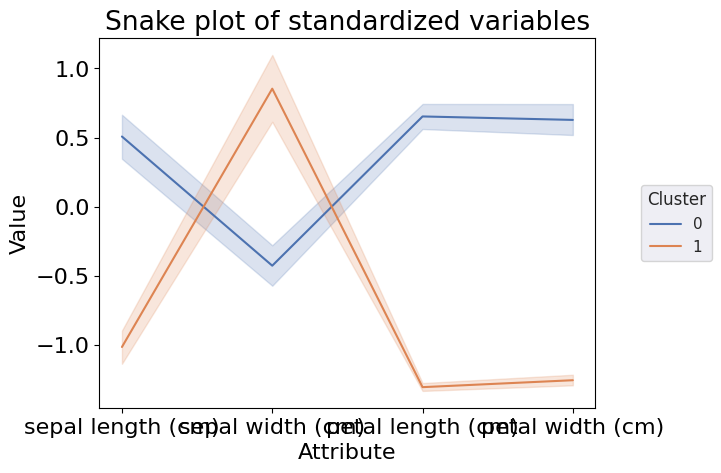

In [31]:
plt.title('Snake plot of standardized variables')
sns.set(rc={'figure.figsize':(15,8)})
sns.lineplot(x="Attribute", y="Value", hue='Cluster', data=df_iris_melt)
plt.legend(loc='center right', bbox_to_anchor=(1.25, 0.5), ncol=1, title='Cluster');

Cluster 0 has a much higher value w.r.t cluster 1.  
The shades around the lines show the distribution of the points, important to understand in which features the clusters differ
Try to repeat this analysis with the other linkage methods

# K-means

It is the most used clustering algorithm, part of the partion-based clustering algorithms.  
A huge defect of k-means w.r.t. hierarchical clustering is that it is entirely based on the number of clusters set by the user; in some cases, it may not be clear how many clusters to define, so the only thing to do is to experiment different values for the number of clusters. Morevoer, the initial random initialization lead to a non-deterministic algorithm

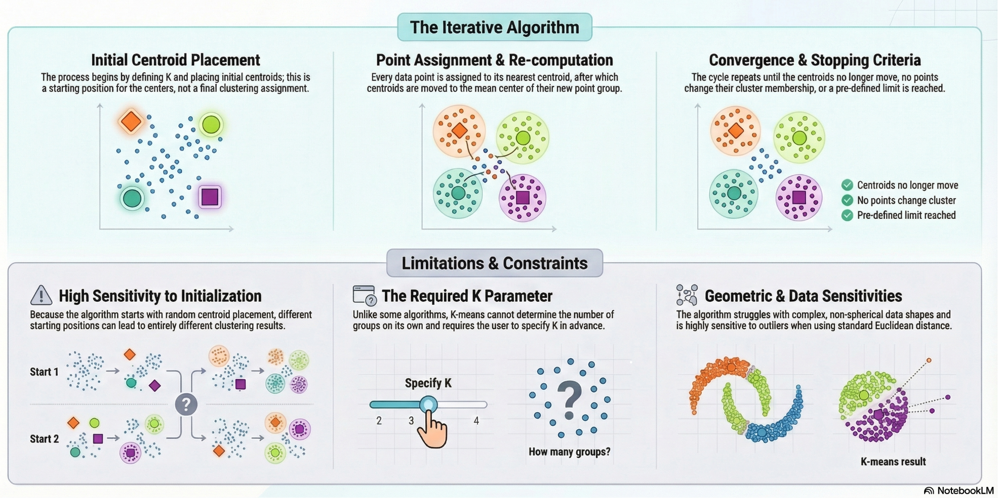

In [32]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import StandardScaler

## Iris (with silhouette)

Silhouette is both a measure of cohesion and separation of clusters, which summarises the goodness of the cluster in a single number. It is based on the difference between the average distance to points in the closest cluster and to points in the same cluster. For each point $x_i$ we calculate its silhouette coefficient $s_i$ as,

$s(x_i) = \frac{b(x_i)-a(x_i)}{max\{a(x_i),b(x_i)\}}$

Where $a(x_i)$ is the average distance between item $x_i$ and all other data within the same cluster; $b(x_i)$ is the mean distances from $x_i$ to points in the closest cluster.

The $s_i$ value of a point $x_i$ lies in the interval [−1,+1]:
- A value close to +1 indicates that $x_i$ is much closer to points in its own cluster and is far from other clusters.
- A value close to zero indicates that $x_i$ is close to the boundary between two clusters.
- A value close to −1 indicates that $x_i$ is much closer to another cluster than its own cluster, and therefore, the point may be mis-clustered.

Silhouette analysis can be used to study the separation distance between the
resulting clusters. The silhouette plot displays a measure of how close each
point in one cluster is to points in the neighboring clusters and thus provides
a way to assess parameters like number of clusters visually. This measure has a
range of [-1, 1] and decreases by increasing the number of clusters.

The **Silhouette Coefficient** is defined as the mean $s_i$ value across all the points. A value close to +1 indicates a good clustering.

$SC = \frac{1}{n} \sum_i s_i$

<b>Drawbacks</b>: note that the Silhouette Coefficient is generally higher for convex clusters than other concepts of clusters, such as density based clusters like those obtained through DBSCAN.

In [ ]:
iris_data = load_iris()
iris4 = pd.DataFrame(iris_data.data, columns=iris_data.feature_names)
species_name = iris_data.target
iris = iris4.copy()
iris['target'] = species_name

In [ ]:
iris4

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


For n_clusters = 2 The average silhouette_score is : 0.6810461692117467
For n_clusters = 3 The average silhouette_score is : 0.5511916046195927
For n_clusters = 4 The average silhouette_score is : 0.4974551890173759
For n_clusters = 5 The average silhouette_score is : 0.45852537090345036
For n_clusters = 6 The average silhouette_score is : 0.33356801081011267


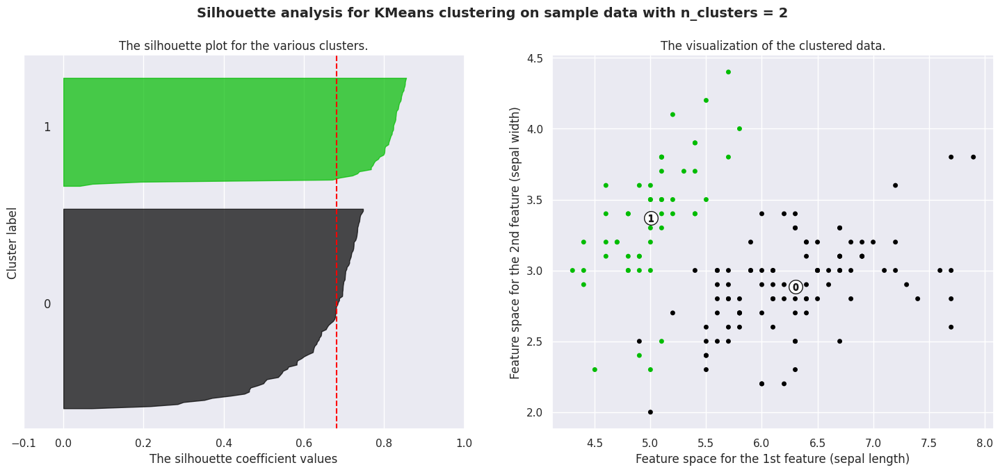

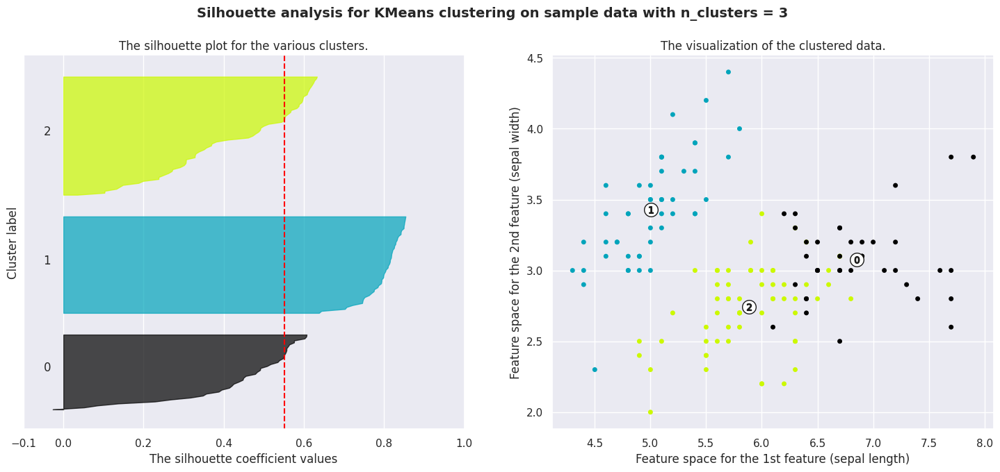

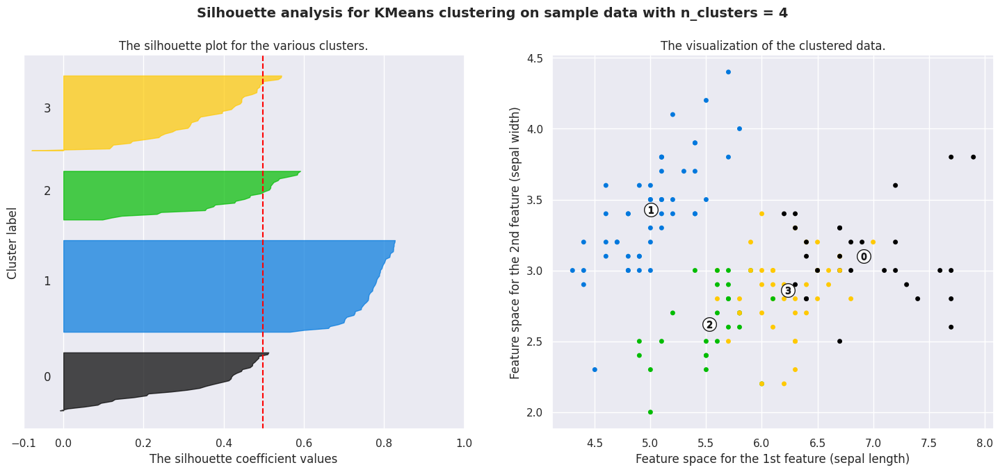

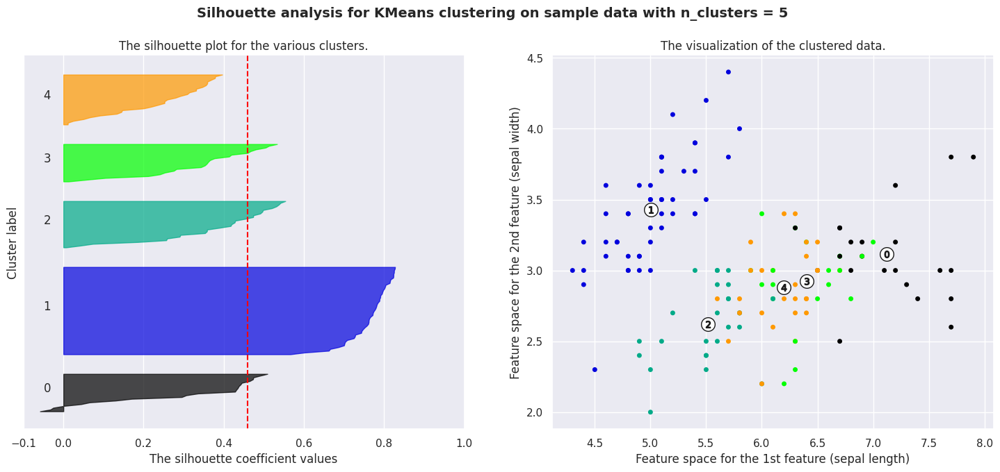

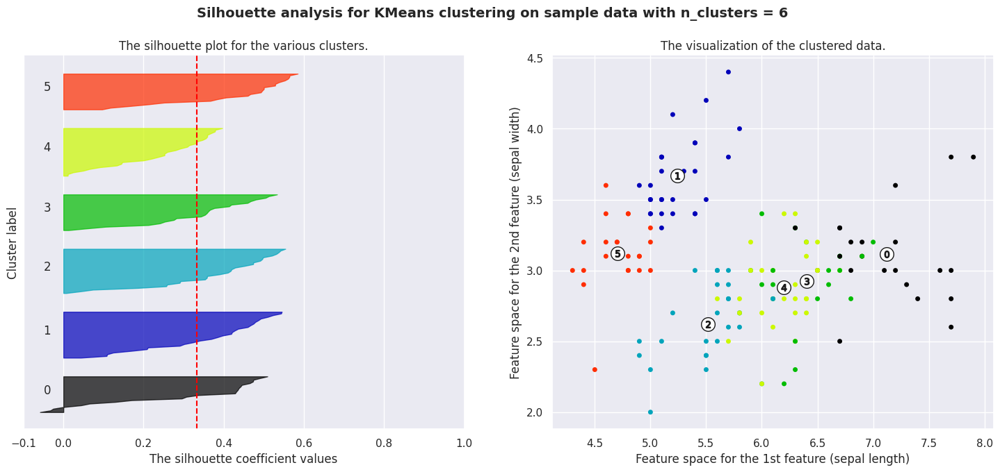

In [33]:
import matplotlib.cm as cm

#scaler = StandardScaler()
#X = scaler.fit_transform(iris.data)

X = iris.iloc[:, :4].values

range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=100, lw=0, alpha=1,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature (sepal length)")
    ax2.set_ylabel("Feature space for the 2nd feature (sepal width)")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

With `n = 2`, the clusters are neatly separated even though some points were misassigned to a cluster; in general, cluster 1 has a high silhouette score.

How can we visualize clusters with 4-dimensional data?

WSS: 78.851441426146


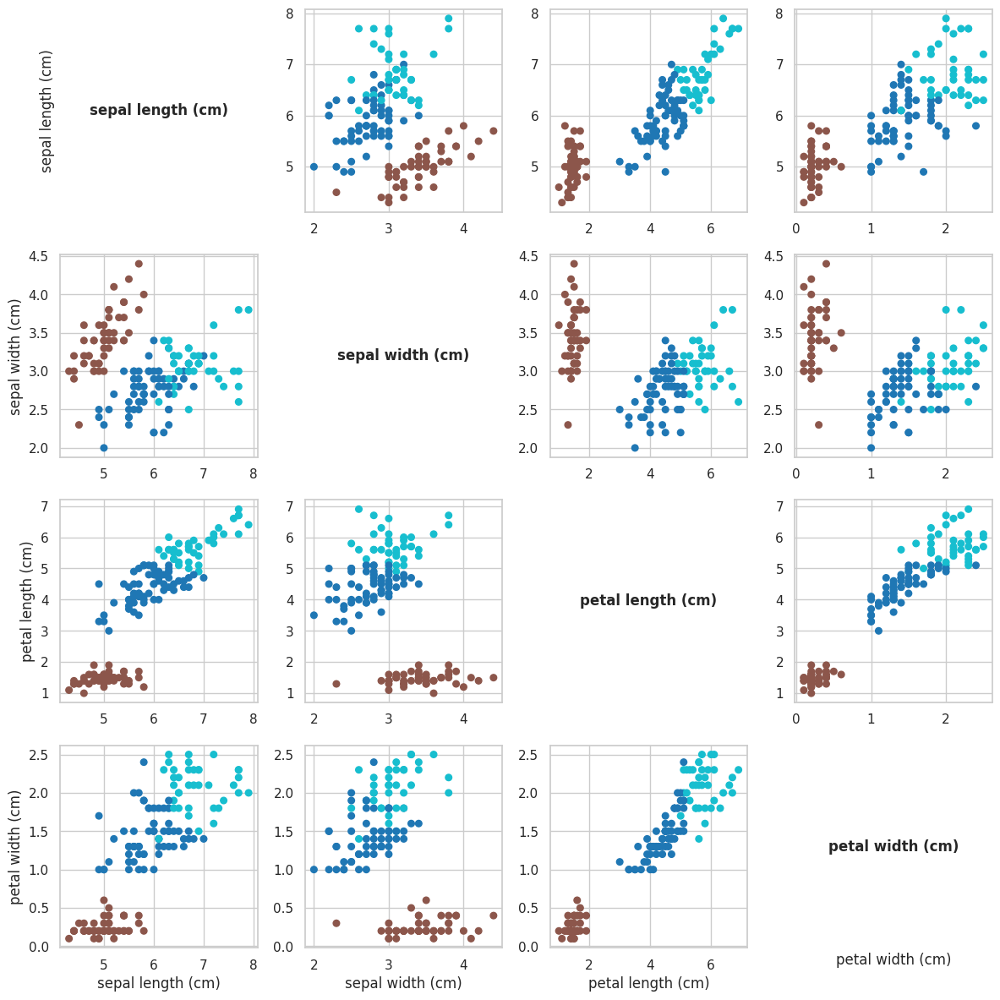

In [ ]:
X = iris.iloc[:, :4].values

kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
kmeans.fit(X)

clusters = kmeans.predict(X)
print('WSS:', kmeans.inertia_)

# Create pairwise scatter plots
sns.set(style="whitegrid")
fig, axes = plt.subplots(4, 4, figsize=(12, 12))  # 4x4 grid for pairwise scatter plots
features = iris4.columns
num_features = len(features)
cmap = cm.get_cmap('tab10', 3)  # Three clusters

for i in range(num_features):
    for j in range(num_features):
        ax = axes[i, j]

        if i == j:
            ax.text(0.5, 0.5, features[i], ha='center', va='center', fontsize=12, fontweight='bold')
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_frame_on(False)
        else:
            colors = np.array([cmap(k) for k in clusters])  # Assign colors based on cluster
            ax.scatter(iris.iloc[:, j], iris.iloc[:, i], s=30, color=colors)

        if i == num_features - 1:
            ax.set_xlabel(features[j])
        if j == 0:
            ax.set_ylabel(features[i])

plt.tight_layout()
plt.show()


Silhouette analysis provides some guidelines (2 or 3 clusters) but it is just one perspective and we should try more approaches and looks for some sort of agreement. For instance, we might check what the elbow and knee analysis has to say about this, looking at WSS/BSS ratio. Computing the WSS/BSS ratio allows us to judge clustering by looking at a single number.

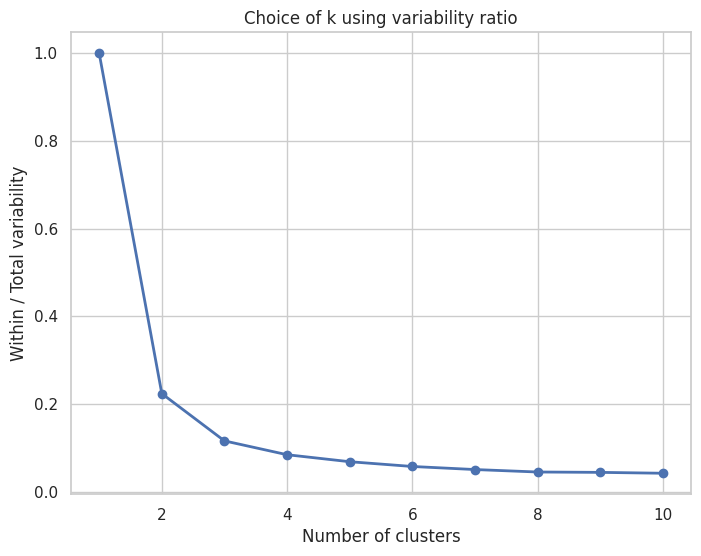

In [ ]:
w = []
b = []
totss = np.sum((X - X.mean(axis=0))**2)
for k_val in range(1, 11):
    km = KMeans(n_clusters=k_val, random_state=42).fit(X)
    withinss = km.inertia_
    between_ss = totss - withinss
    w.append(withinss)
    b.append(between_ss)
ratio = np.array(w) / (np.array(w) + np.array(b))
plt.figure(figsize=(8,6))
plt.plot(range(1, 11), ratio, marker='o', linewidth=2)
plt.xlabel("Number of clusters")
plt.ylabel("Within / Total variability")
plt.title("Choice of k using variability ratio")
plt.show()

## Initialization effect

*n_init* runs k-means multiple times with different initializations and choose the best one wrt to WSS (also called *inertia*).

The default initialization in scikit-learn is *k-means++* which is optimized to spread out the initial positioning of the centroid, so that two centroids are never put near one to each other. With this initialization, the default *n_init* is 1, while with the *random* initialization the default *n_init* is 10.

The SciPy function `make_blobs()` is used to generate a random dataset with a fixed number of points.

WSS: 2816.00381961024
WSS: 2812.82224980263


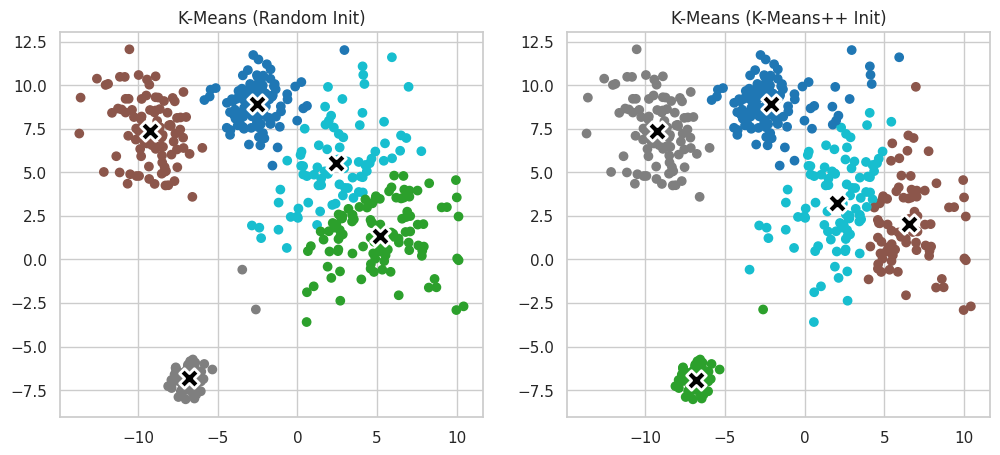

In [ ]:
X, _ = make_blobs(n_samples=500, centers=5, cluster_std=[1.0, 2.5, 0.5, 1.8, 3.2], random_state=42)

# Fit K-Means with random initialization
kmeans_random = KMeans(n_clusters=5, init='random', random_state=12, n_init=1)
kmeans_random.fit(X)
clusters_random = kmeans_random.predict(X)
print('WSS:', kmeans_random.inertia_)

# Fit K-Means with k-means++ initialization
kmeans_plus = KMeans(n_clusters=5, init='k-means++', random_state=12, n_init=1)
kmeans_plus.fit(X)
clusters_plus = kmeans_plus.predict(X)
print('WSS:', kmeans_plus.inertia_)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Scatter plot for random initialization
axes[0].scatter(X[:, 0], X[:, 1], c=clusters_random, cmap=cm.get_cmap('tab10', 5))
axes[0].scatter(kmeans_random.cluster_centers_[:, 0], kmeans_random.cluster_centers_[:, 1],
                s=200, c='black', marker='X', edgecolors='white', linewidth=2)
axes[0].set_title("K-Means (Random Init)")

# Scatter plot for k-means++ initialization
axes[1].scatter(X[:, 0], X[:, 1], c=clusters_plus, cmap=cm.get_cmap('tab10', 5))
axes[1].scatter(kmeans_plus.cluster_centers_[:, 0], kmeans_plus.cluster_centers_[:, 1],
                s=200, c='black', marker='X', edgecolors='white', linewidth=2)
axes[1].set_title("K-Means (K-Means++ Init)")

plt.show()


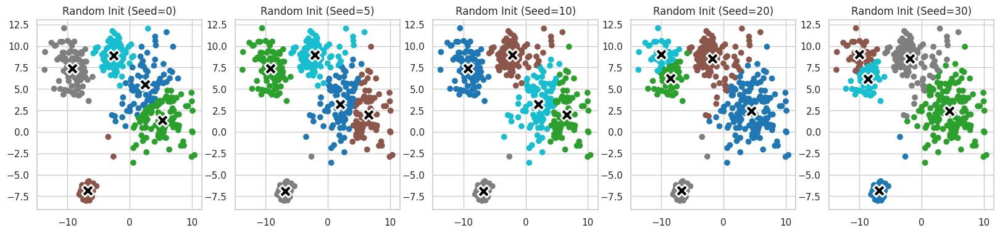

In [ ]:
# Run K-Means multiple times with different seeds
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for i, seed in enumerate([0, 5, 10, 20, 30]):
    kmeans = KMeans(n_clusters=5, init='random', random_state=seed, n_init=1)
    kmeans.fit(X)
    clusters = kmeans.predict(X)

    # Scatter plot
    axes[i].scatter(X[:, 0], X[:, 1], c=clusters, cmap=cm.get_cmap('tab10', 5))
    axes[i].scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                    s=200, c='black', marker='X', edgecolors='white', linewidth=2)
    axes[i].set_title(f"Random Init (Seed={seed})")

plt.show()


## Standardization

Should we apply standardization when performing clustering?

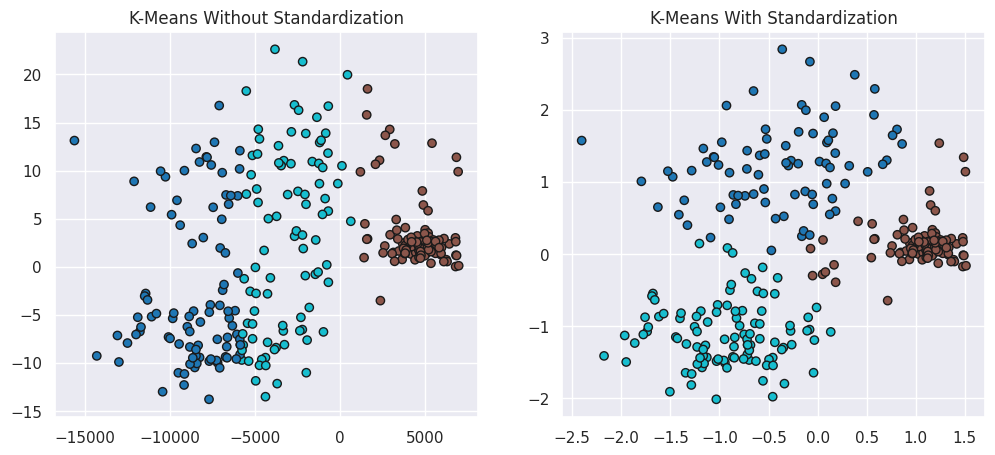

In [34]:
from sklearn.datasets import make_blobs

# Generate synthetic data with three clusters
X, _ = make_blobs(n_samples=300, centers=3, cluster_std=[5.0, 1.0, 3.0], random_state=42)

# Scale one feature to be much larger than the other
X[:, 0] *= 1000  # Multiply first feature by 1000 (large scale)

# K-Means clustering without standardization
kmeans_no_scaling = KMeans(n_clusters=3, random_state=42)
clusters_no_scaling = kmeans_no_scaling.fit_predict(X)

# Standardize the dataset
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# K-Means clustering with standardization
kmeans_scaled = KMeans(n_clusters=3, random_state=42, n_init=10)
clusters_scaled = kmeans_scaled.fit_predict(X_scaled)

# Plot results
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Without Standardization
axes[0].scatter(X[:, 0], X[:, 1], c=clusters_no_scaling, cmap='tab10', edgecolors='k')
axes[0].set_title("K-Means Without Standardization")

# With Standardization
axes[1].scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters_scaled, cmap='tab10', edgecolors='k')
axes[1].set_title("K-Means With Standardization")

plt.show()


K-means is not scale-invariant, so the results are completely different with and without standardization!

Without scaling:

You’re implicitly weighting features by their variance.

With scaling:

You’re assuming all features should contribute equally.

There is not a correct choice: it depends on the problem and on the data  
This problem is the same one faced when choosing between Camberra, Euclidean and Manhattan distances.

## Dimensionality Reduction

Intuitively speaking, it seems to be good to perform dimensionality reduction before clustering. In hierarchical clustering, this is justified by the complexity of computing distances in a high-dimensional space.  
In generating the dataset, we are sure there are three well-separated clusters because data are drawn from two normal distributions with very different average values.  
An example where applying PCA before clustering is harmful


Contingency Table - Original 2D:
K-Means_2D    0    1    2
True                     
0             0    1  199
1           199    1    0
2             3  197    0 

Contingency Table - After PCA to 1D:
K-Means_1D    0    1    2
True                     
0             4    0  196
1           174   26    0
2            24  176    0


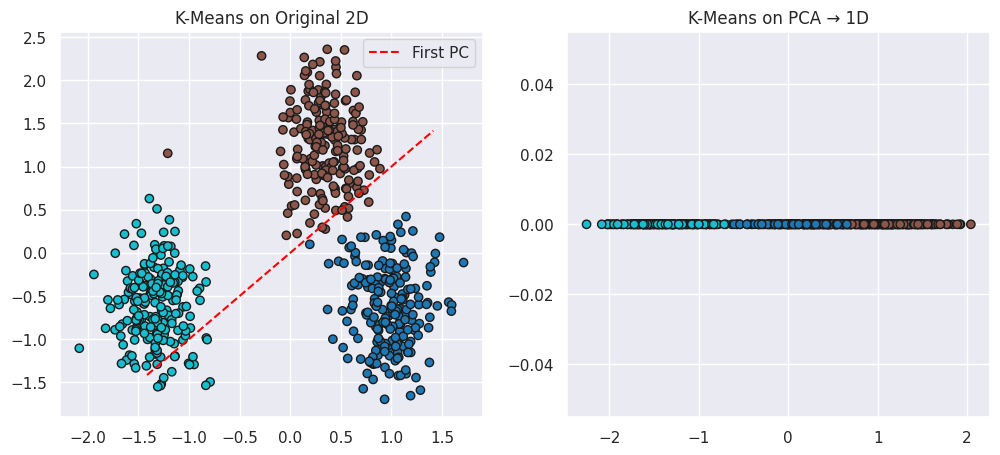

In [35]:
# --------------------------------------------------------
# Generate a simple 2D dataset with 3 well-separated clusters
# --------------------------------------------------------
rng = np.random.RandomState(42)

n_per_cluster = 200

# Cluster 1 around (0, 0)
X1 = rng.normal(loc=[0, 0], scale=1.0, size=(n_per_cluster, 2))
y1 = np.zeros(n_per_cluster, dtype=int)

# Cluster 2 around (10, 0)
X2 = rng.normal(loc=[10, 0], scale=1.0, size=(n_per_cluster, 2))
y2 = np.ones(n_per_cluster, dtype=int)

# Cluster 3 around (5, 5)
X3 = rng.normal(loc=[7, 4], scale=1.0, size=(n_per_cluster, 2))
y3 = np.full(n_per_cluster, 2, dtype=int)

# Combine into one dataset
X_2D = np.vstack([X1, X2, X3])
y_true = np.concatenate([y1, y2, y3])

# Standardize the data so it's centered at (0,0) with unit variance
scaler = StandardScaler()
X_2D_scaled = scaler.fit_transform(X_2D)

# --------------------------------------------------------
# K-Means on the original 2D data
# --------------------------------------------------------
kmeans_2d = KMeans(n_clusters=3, random_state=42, n_init=10)
labels_2d = kmeans_2d.fit_predict(X_2D_scaled)

# --------------------------------------------------------
# PCA to 1D, then K-Means
# --------------------------------------------------------
pca_1d = PCA(n_components=1, random_state=42)
X_1D = pca_1d.fit_transform(X_2D_scaled)

kmeans_1d = KMeans(n_clusters=3, random_state=42, n_init=10)
labels_1d = kmeans_1d.fit_predict(X_1D)


# --------------------------------------------------------
# Contingency tables
# --------------------------------------------------------
cont_2d = pd.crosstab(pd.Series(y_true, name='True'),
                      pd.Series(labels_2d, name='K-Means_2D'))
cont_1d = pd.crosstab(pd.Series(y_true, name='True'),
                      pd.Series(labels_1d, name='K-Means_1D'))

print("\nContingency Table - Original 2D:")
print(cont_2d, "\n")
print("Contingency Table - After PCA to 1D:")
print(cont_1d)

# --------------------------------------------------------
# Plot results: including the 1D PCA direction
# --------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# (A) Scatter in original 2D (scaled), color by K-Means cluster
axes[0].scatter(X_2D_scaled[:, 0], X_2D_scaled[:, 1],
                c=labels_2d, cmap="tab10", edgecolor='k')
axes[0].set_title("K-Means on Original 2D")

pc_vector = pca_1d.components_[0]  # shape: (2,)
# We'll draw a line passing through the origin (center = 0,0 after StandardScaler)
# param "alpha" will range from -5 to +5 for a visually nice line
alpha_vals = np.linspace(-2, 2, 100)
line_x = alpha_vals * pc_vector[0]
line_y = alpha_vals * pc_vector[1]

axes[0].plot(line_x, line_y, color='red', linestyle='--', label='First PC')
axes[0].legend()

axes[1].scatter(X_1D[:, 0], np.zeros_like(X_1D[:, 0]),
                c=labels_1d, cmap="tab10", edgecolor='k')
axes[1].set_title("K-Means on PCA → 1D")

plt.show()


In [ ]:
## TODO at home: can you find a dataset (real or synthetic) where PCA is helpful?
## The dataset must be high-dimensional

# Supplementary Material

## K-means Iterative Simulation

Simulate data belonging to three clusters

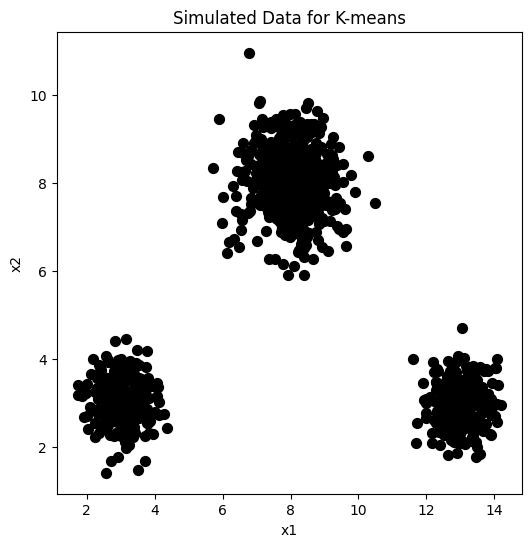

In [ ]:
np.random.seed(1)

clusterA = np.random.normal([8,8], .75, (500,2))
clusterB = np.random.normal([3,3], .5, (250,2))
clusterC = np.random.normal([13,3], .5, (250,2))

x_data = np.concatenate((clusterA, clusterB, clusterC))

plt.figure(figsize=(6,6))
plt.scatter(x_data[:,0], x_data[:,1], c='black', s=50)
plt.xlabel("x1")
plt.ylabel("x2")
plt.title("Simulated Data for K-means")
plt.show()

Simulate k-means step-by-step execution

iteration  0
[[8.17888718 5.73646988]
 [7.98152621 5.55164672]
 [7.91311058 5.25665717]]
iteration  1
[[9.32152254 6.86728762]
 [6.45144978 6.86941434]
 [5.60283074 2.89630097]]
iteration  2
[[10.58292546  5.66990775]
 [ 7.35451667  8.09879361]
 [ 3.03964586  3.03814593]]
iteration  3
[[12.82753185  3.16195038]
 [ 8.00178631  8.05165588]
 [ 3.03964586  3.03814593]]
iteration  4
[[12.99259293  2.98426617]
 [ 8.03507366  8.02314505]
 [ 3.03964586  3.03814593]]


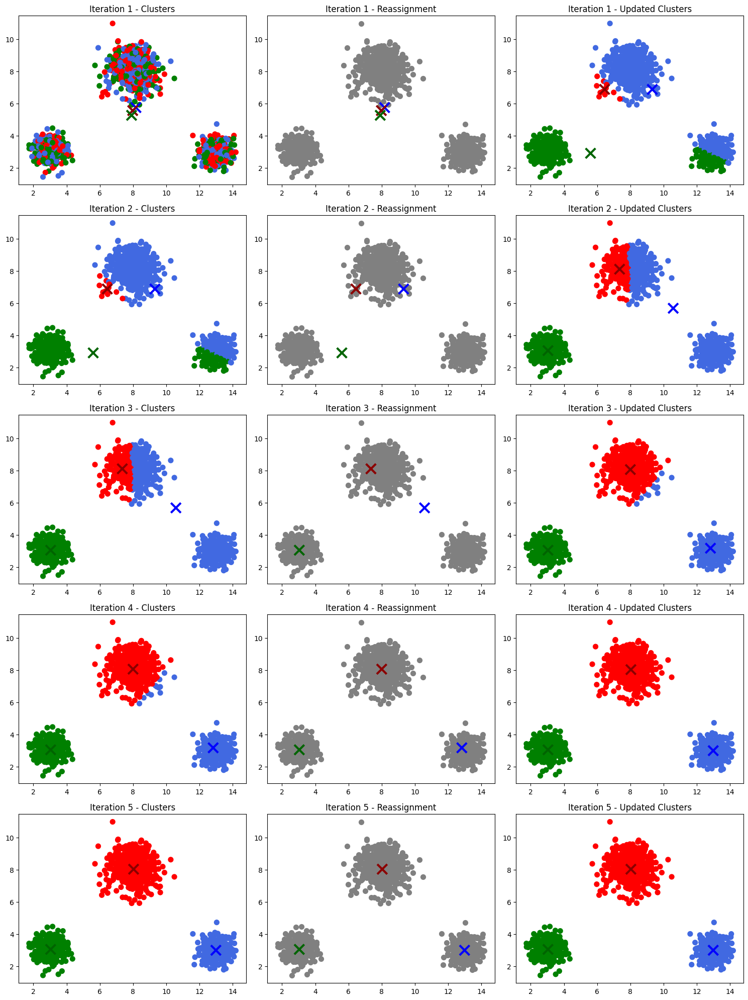

In [ ]:
k = 3
n=1000
np.random.seed(0)
# Initial random cluster assignments
cluster_assign = np.random.choice([0, 1, 2], size=n)
iter_max = 5

colplot = ['royalblue', 'red', 'green']
colpoints = ['blue', 'darkred', 'darkgreen']

fig, axs = plt.subplots(iter_max, 3, figsize=(15, 4 * iter_max))
for i in range(iter_max):
    print('iteration ', i)
    # Compute cluster centers:
    C = np.array([x_data[cluster_assign == l].mean(axis=0) for l in range(k)])
    print(C)
    # Plot current clustering:
    axs[i, 0].scatter(x_data[:,0], x_data[:,1],
                      c=[colplot[c] for c in cluster_assign], s=50)
    axs[i, 0].scatter(C[:,0], C[:,1], c=colpoints, marker='x', s=200, linewidths=3)
    axs[i, 0].set_title(f"Iteration {i+1} - Clusters")

    # Reassign clusters based on Euclidean distance:
    D = np.linalg.norm(x_data[:, None, :] - C[None, :, :], axis=2)
    cluster_assign = np.argmin(D, axis=1)

    axs[i, 1].scatter(x_data[:,0], x_data[:,1], c='grey', s=50)
    axs[i, 1].scatter(C[:,0], C[:,1], c=colpoints, marker='x', s=200, linewidths=3)
    axs[i, 1].set_title(f"Iteration {i+1} - Reassignment")

    # After reassignment, update centers and plot:
    C = np.array([x_data[cluster_assign == l].mean(axis=0) for l in range(k)])
    axs[i, 2].scatter(x_data[:,0], x_data[:,1],
                      c=[colplot[c] for c in cluster_assign], s=50)
    axs[i, 2].scatter(C[:,0], C[:,1], c=colpoints, marker='x', s=200, linewidths=3)
    axs[i, 2].set_title(f"Iteration {i+1} - Updated Clusters")
plt.tight_layout()
plt.show()

## Limitations of K-Means

Let's some peculiar cases in which k-means can fail

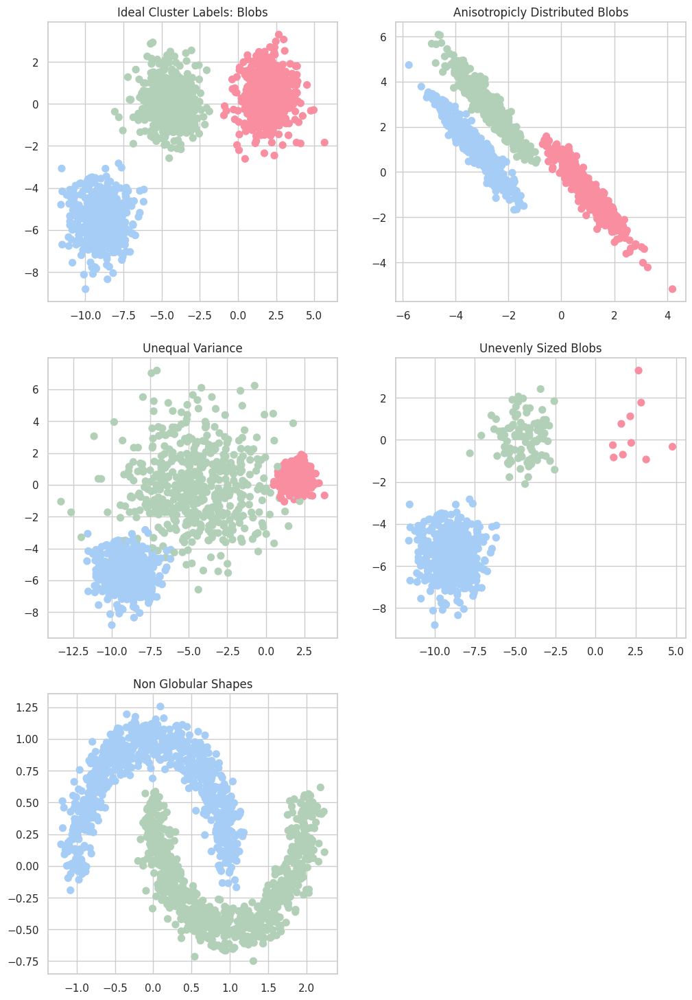

In [ ]:
# Define the color palettes
data_colors = ['#a6cdf6','#b2d0b7','#f98ea1']
background_cmap3 = ListedColormap(['#a6cdf6','#b2d0b7','#f98ea1'])

plt.figure(figsize=(12, 18))
n_samples = 1500
random_state = 170

###############################################
# Incorrect number of clusters
# make_blobs generate by default 3 isotropic Gaussian blobs. What if you specify an incorrect number of blobs, like 2?
###############################################
X, y = make_blobs(n_samples=n_samples, random_state=random_state)

plt.subplot(321)
plt.scatter(X[:, 0], X[:, 1], s=50, c=[data_colors[label] for label in y], cmap=background_cmap3)
plt.title("Ideal Cluster Labels: Blobs")

###############################################
# Anisotropicly distributed data
###############################################
transformation = np.array([[0.60834549, -0.63667341], [-0.40887718, 0.85253229]])
X_aniso = np.dot(X, transformation)

plt.subplot(322)
plt.scatter(X_aniso[:, 0], X_aniso[:, 1], s=50, c=[data_colors[label] for label in y], cmap=background_cmap3)
plt.title("Anisotropicly Distributed Blobs")

###############################################
# Different variance
###############################################
X_varied, y_varied = make_blobs(n_samples=n_samples,
                                cluster_std=[1.0, 2.5, 0.5],
                                random_state=random_state)

plt.subplot(323)
plt.scatter(X_varied[:, 0], X_varied[:, 1], s=50, c=[data_colors[label] for label in y_varied], cmap=background_cmap3)
plt.title("Unequal Variance")

###############################################
# Unevenly sized blobs
###############################################
X_filtered = np.vstack((X[y == 0][:500], X[y == 1][:100], X[y == 2][:10]))
y_filtered = np.concatenate((y[y == 0][:500], y[y == 1][:100], y[y == 2][:10]))

plt.subplot(324)
plt.scatter(X_filtered[:, 0], X_filtered[:, 1], s=50, c=[data_colors[label] for label in y_filtered], cmap=background_cmap3)
plt.title("Unevenly Sized Blobs")

###############################################
# Unevenly sized blobs
###############################################
X, y = make_moons(n_samples=1500, random_state=170, noise=0.1)

plt.subplot(325)
plt.scatter(X[:, 0], X[:, 1], s=50, c=[data_colors[l] for l in y], cmap=background_cmap3)
plt.title("Non Globular Shapes")


plt.show()

In [ ]:
## TODO: given the dataset above, try to cluster them with k-means

## Hierarchical Clustering - Simulated data

### Univariate

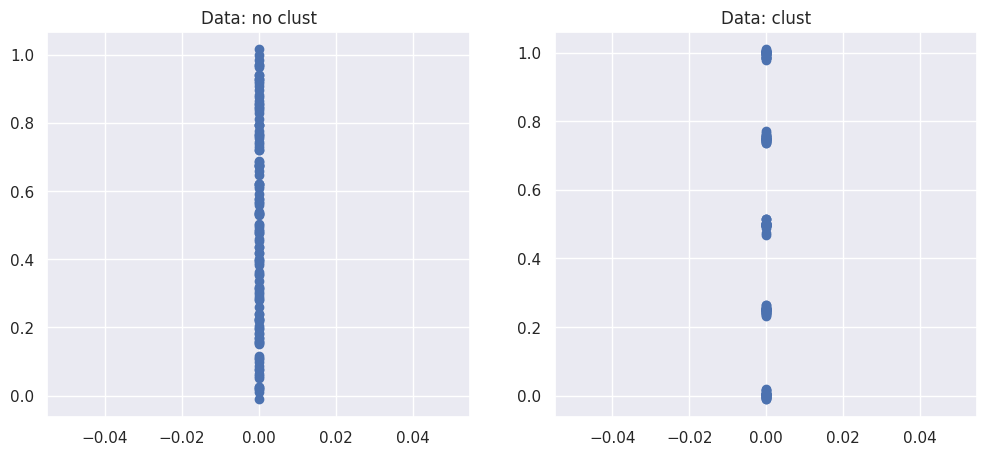

In [ ]:
# x : vector of NON clustered data
x = np.linspace(0, 1, 125) + np.random.normal(scale=0.01, size=125)
# y: 5 clusters of 25 points each
y = np.concatenate([np.random.normal(loc=mean, scale=0.01, size=25) for mean in [0, 0.25, 0.5, 0.75, 1]])
x = np.random.permutation(x)
y = np.random.permutation(y)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(np.zeros(125), x, 'o')
plt.title("Data: no clust")
plt.subplot(1,2,2)
plt.plot(np.zeros(125), y, 'o')
plt.title("Data: clust")
plt.show()

In [ ]:
dx = pdist(x.reshape(-1,1), metric='euclidean')
dy = pdist(y.reshape(-1,1), metric='euclidean')
hcx = linkage(dx, method='single')
hcy = linkage(dy, method='single')

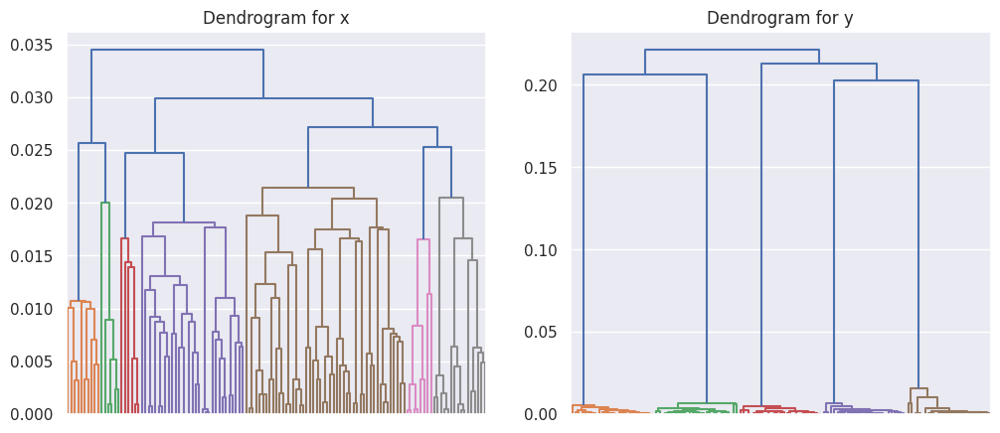

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
dendrogram(hcx, no_labels=True)
plt.title("Dendrogram for x")
plt.subplot(1,2,2)
dendrogram(hcy, no_labels=True)
plt.title("Dendrogram for y")
plt.show()

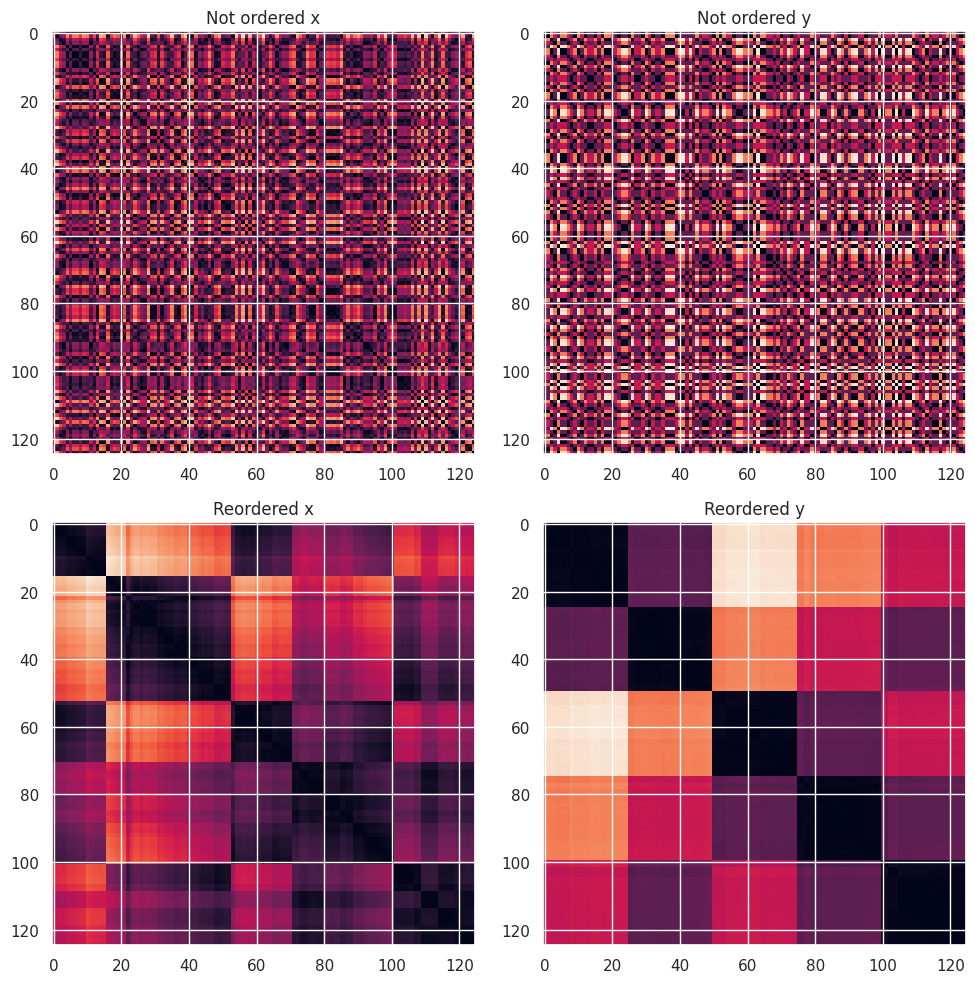

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.imshow(squareform(dx), aspect='equal')
plt.title("Not ordered x")
plt.subplot(2,2,2)
plt.imshow(squareform(dy), aspect='equal')
plt.title("Not ordered y")

order_x = dendrogram(hcx, no_plot=True)['leaves']
order_y = dendrogram(hcy, no_plot=True)['leaves']
plt.subplot(2,2,3)
plt.imshow(squareform(dx)[np.ix_(order_x, order_x)], aspect='equal')
plt.title("Reordered x")
plt.subplot(2,2,4)
plt.imshow(squareform(dy)[np.ix_(order_y, order_y)], aspect='equal')
plt.title("Reordered y")
plt.tight_layout()
plt.show()

### Bivariate 1

Chaining effect with single linkage

In [ ]:
p = 2
n = 100
mu1 = [0, 1]
mu2 = [5, 1.2]
sig = np.eye(p)
np.random.seed(1)
X1 = np.random.multivariate_normal(mu1, sig, n)
X2 = np.random.multivariate_normal(mu2, sig, n)
X = np.vstack([X1, X2])

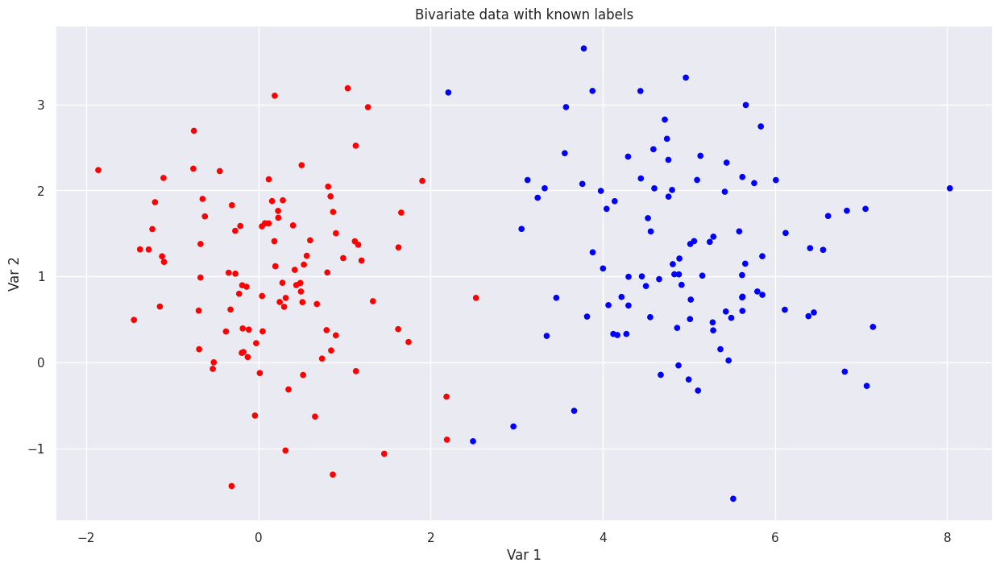

In [ ]:
plt.figure()
plt.scatter(X[:,0], X[:,1], c=np.repeat(['red','blue'], n), s=20)
plt.xlabel("Var 1")
plt.ylabel("Var 2")
plt.title("Bivariate data with known labels")
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

In [ ]:
## TODO apply hierarchical clustering with different linkages
x_d = pdist(X, metric='euclidean')
x_es = linkage(x_d, method='single')
x_ea = linkage(x_d, method='average')
x_ec = linkage(x_d, method='complete')

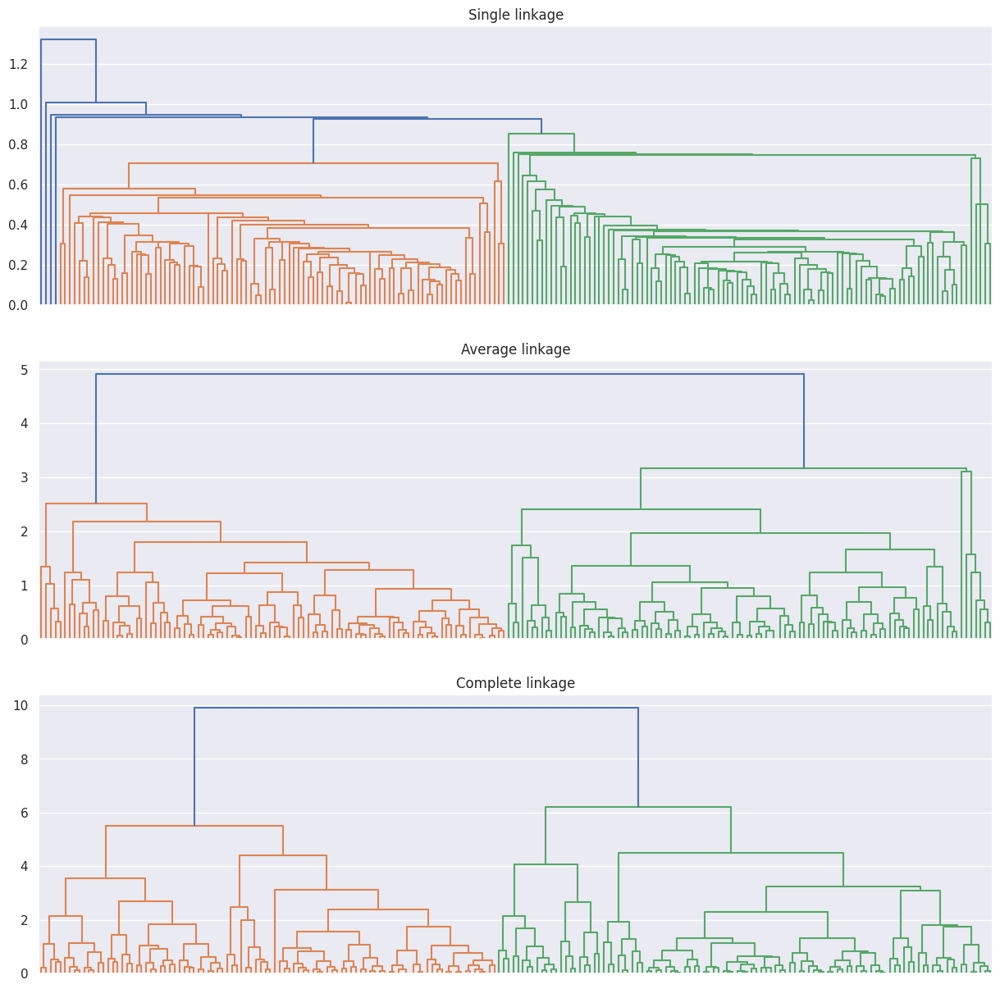

In [ ]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
dendrogram(x_es, ax=axs[0], no_labels=True)
axs[0].set_title("Single linkage")
dendrogram(x_ea, ax=axs[1], no_labels=True)
axs[1].set_title("Average linkage")
dendrogram(x_ec, ax=axs[2], no_labels=True)
axs[2].set_title("Complete linkage")
plt.show()

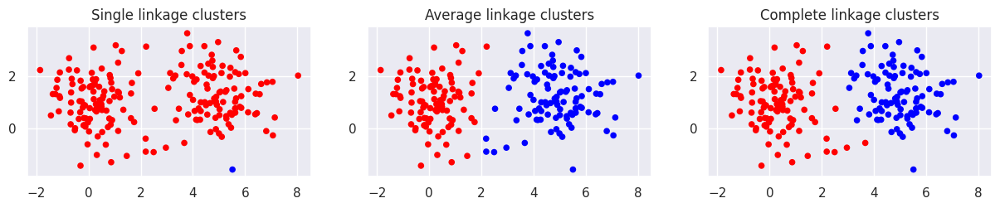

In [ ]:
# Cut the dendrogram to get 2 clusters
cluster_es = cut_tree(x_es, n_clusters=2).flatten()
cluster_ea = cut_tree(x_ea, n_clusters=2).flatten()
cluster_ec = cut_tree(x_ec, n_clusters=2).flatten()

fig, axs = plt.subplots(1,3, figsize=(15,5))
axs[0].scatter(X[:,0], X[:,1], c=np.where(cluster_es==0, 'red','blue'), s=20)
axs[0].set_title("Single linkage clusters")
axs[1].scatter(X[:,0], X[:,1], c=np.where(cluster_ea==0, 'red','blue'), s=20)
axs[1].set_title("Average linkage clusters")
axs[2].scatter(X[:,0], X[:,1], c=np.where(cluster_ec==0, 'red','blue'), s=20)
axs[2].set_title("Complete linkage clusters")
for ax in axs:
    ax.set_aspect('equal', adjustable='box')
plt.show()

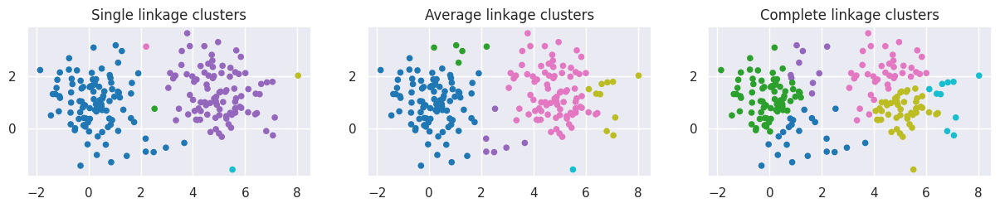

In [ ]:
# Cut the dendrogram to get more clusters
k=6
cmap = plt.get_cmap('tab10')

cluster_es = cut_tree(x_es, n_clusters=k).flatten()
cluster_ea = cut_tree(x_ea, n_clusters=k).flatten()
cluster_ec = cut_tree(x_ec, n_clusters=k).flatten()

fig, axs = plt.subplots(1,3, figsize=(15,5))
axs[0].scatter(X[:,0], X[:,1], c=cluster_es, cmap=cmap, s=20)
axs[0].set_title("Single linkage clusters")
axs[1].scatter(X[:,0], X[:,1], c=cluster_ea, cmap=cmap, s=20)
axs[1].set_title("Average linkage clusters")
axs[2].scatter(X[:,0], X[:,1], c=cluster_ec, cmap=cmap, s=20)
axs[2].set_title("Complete linkage clusters")
for ax in axs:
    ax.set_aspect('equal', adjustable='box')
plt.show()

### Bivariate 2

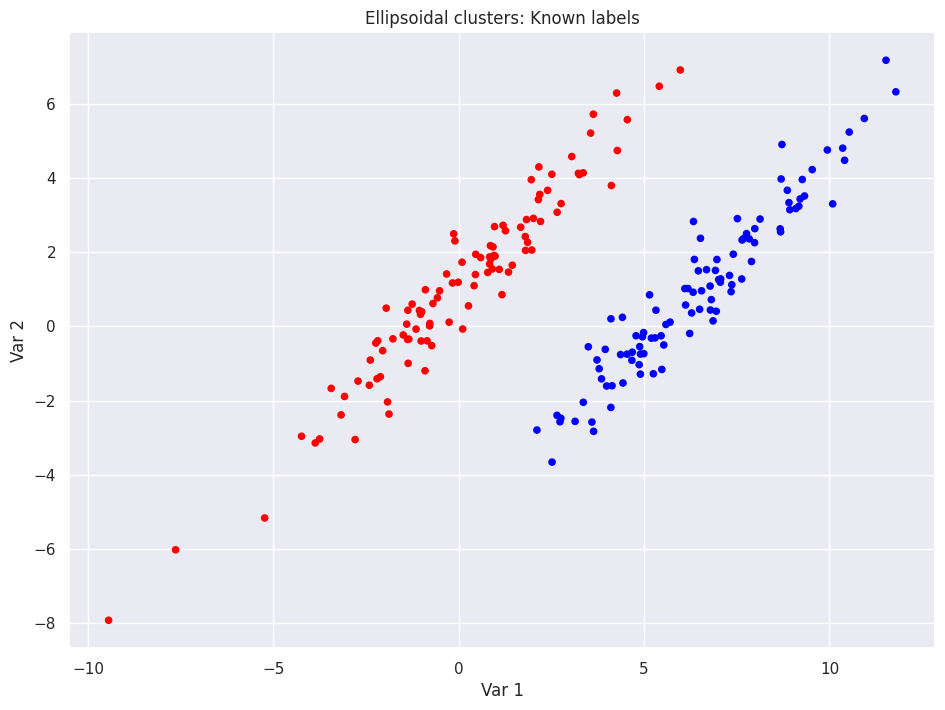

In [ ]:
p = 2
n = 100
mu1 = [0, 1]
mu2 = [6.5, 1]
e1 = np.array([1, 1])
e2 = np.array([-1, 1])
sig = 5 * np.outer(e1, e1) + 0.1 * np.outer(e2, e2)
np.random.seed(2)
X1 = np.random.multivariate_normal(mu1, sig, n)
X2 = np.random.multivariate_normal(mu2, sig, n)
X = np.vstack([X1, X2])
plt.figure()
plt.scatter(X[:,0], X[:,1], c=np.repeat(['red','blue'], n), s=20)
plt.xlabel("Var 1")
plt.ylabel("Var 2")
plt.title("Ellipsoidal clusters: Known labels")
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

In [ ]:
#### TODO: apply hierarchical clustering with different linkages

In [ ]:
x_d = pdist(X, metric='euclidean')
x_es = linkage(x_d, method='single')
x_ea = linkage(x_d, method='average')
x_ec = linkage(x_d, method='complete')

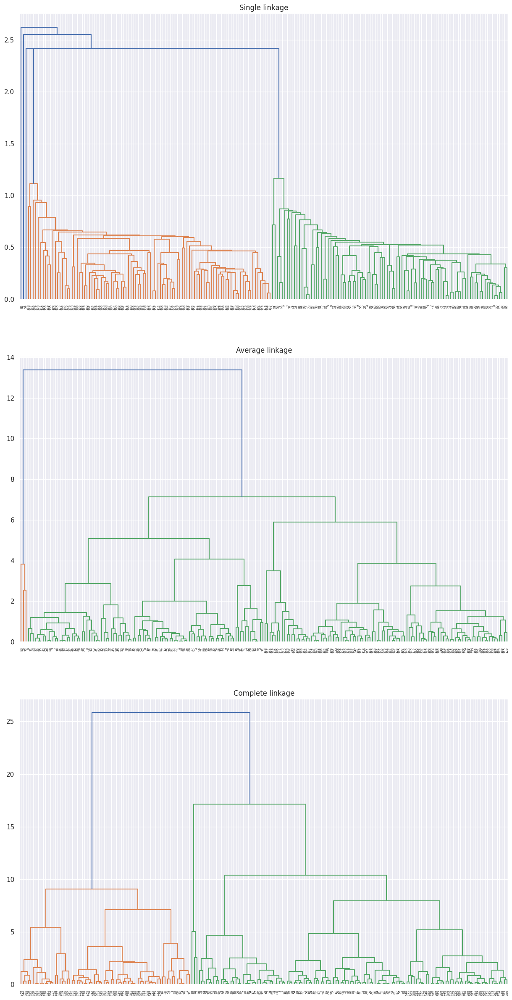

In [ ]:
fig, axs = plt.subplots(3,1, figsize=(15,30))
dendrogram(x_es, ax=axs[0], no_labels=False)
axs[0].set_title("Single linkage")
dendrogram(x_ea, ax=axs[1], no_labels=False)
axs[1].set_title("Average linkage")
dendrogram(x_ec, ax=axs[2], no_labels=False)
axs[2].set_title("Complete linkage")
plt.show()

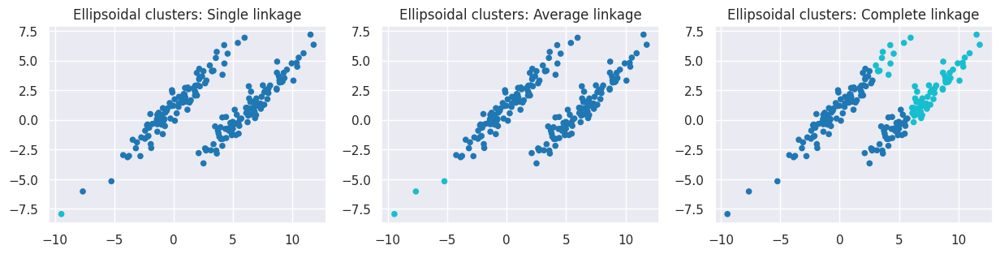

In [ ]:
k=2
cluster_es = cut_tree(x_es, n_clusters=k).flatten()
cluster_ea = cut_tree(x_ea, n_clusters=k).flatten()
cluster_ec = cut_tree(x_ec, n_clusters=k).flatten()

fig, axs = plt.subplots(1,3, figsize=(15,5))
axs[0].scatter(X[:,0], X[:,1], c=cluster_es+1, s=20, cmap='tab10')
axs[0].set_title("Ellipsoidal clusters: Single linkage")
axs[1].scatter(X[:,0], X[:,1], c=cluster_ea+1, s=20, cmap='tab10')
axs[1].set_title("Ellipsoidal clusters: Average linkage")
axs[2].scatter(X[:,0], X[:,1], c=cluster_ec+1, s=20, cmap='tab10')
axs[2].set_title("Ellipsoidal clusters: Complete linkage")
for ax in axs:
    ax.set_aspect('equal', adjustable='box')
plt.show()

What if we remove some outliers?

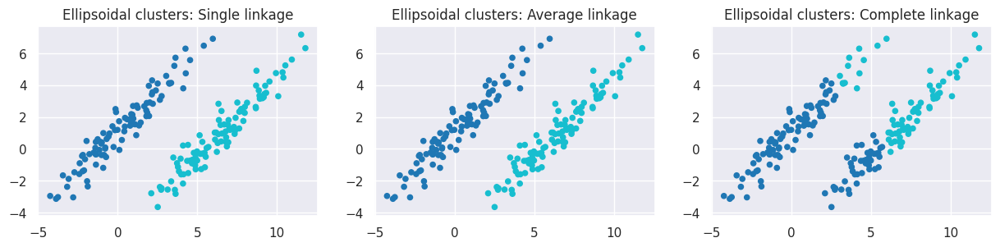

In [ ]:
X_filtered = X[X[:, 1] > -5]
x_d = pdist(X_filtered, metric='euclidean')
x_es = linkage(x_d, method='single')
x_ea = linkage(x_d, method='average')
x_ec = linkage(x_d, method='complete')
k=2
cluster_es = cut_tree(x_es, n_clusters=k).flatten()
cluster_ea = cut_tree(x_ea, n_clusters=k).flatten()
cluster_ec = cut_tree(x_ec, n_clusters=k).flatten()

fig, axs = plt.subplots(1,3, figsize=(15,5))
axs[0].scatter(X_filtered[:,0], X_filtered[:,1], c=cluster_es+1, s=20, cmap='tab10')
axs[0].set_title("Ellipsoidal clusters: Single linkage")
axs[1].scatter(X_filtered[:,0], X_filtered[:,1], c=cluster_ea+1, s=20, cmap='tab10')
axs[1].set_title("Ellipsoidal clusters: Average linkage")
axs[2].scatter(X_filtered[:,0], X_filtered[:,1], c=cluster_ec+1, s=20, cmap='tab10')
axs[2].set_title("Ellipsoidal clusters: Complete linkage")
for ax in axs:
    ax.set_aspect('equal', adjustable='box')
plt.show()

## Earthquake dataset - K-means

In [ ]:
# Load the quakes dataset from R via statsmodels
quakes = sm.datasets.get_rdataset("quakes", "datasets").data
Q = quakes.iloc[:, :2].copy()
Q['depth'] = -quakes.iloc[:, 2] / 100
print(Q)

       lat    long  depth
0   -20.42  181.62  -5.62
1   -20.62  181.03  -6.50
2   -26.00  184.10  -0.42
3   -17.97  181.66  -6.26
4   -20.42  181.96  -6.49
..     ...     ...    ...
995 -25.93  179.54  -4.70
996 -12.28  167.06  -2.48
997 -20.13  184.20  -2.44
998 -17.40  187.80  -0.40
999 -21.59  170.56  -1.65

[1000 rows x 3 columns]


In [ ]:
# 3d scatterplot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(Q.iloc[:,0], Q.iloc[:,1], Q['depth'], c='blue', s=20)
ax.set_title("Quakes Data (3D)")
ax.view_init(elev=20, azim=50)
plt.show()

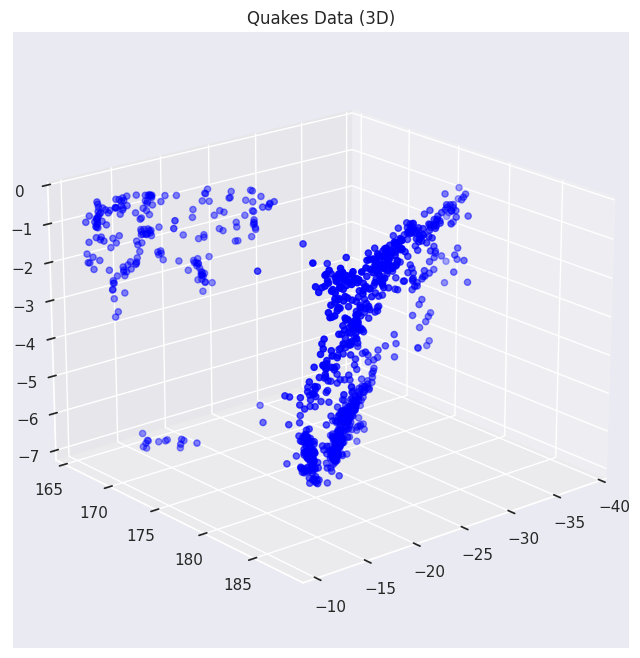

In [ ]:
# Run K-Means, print the cluster centers

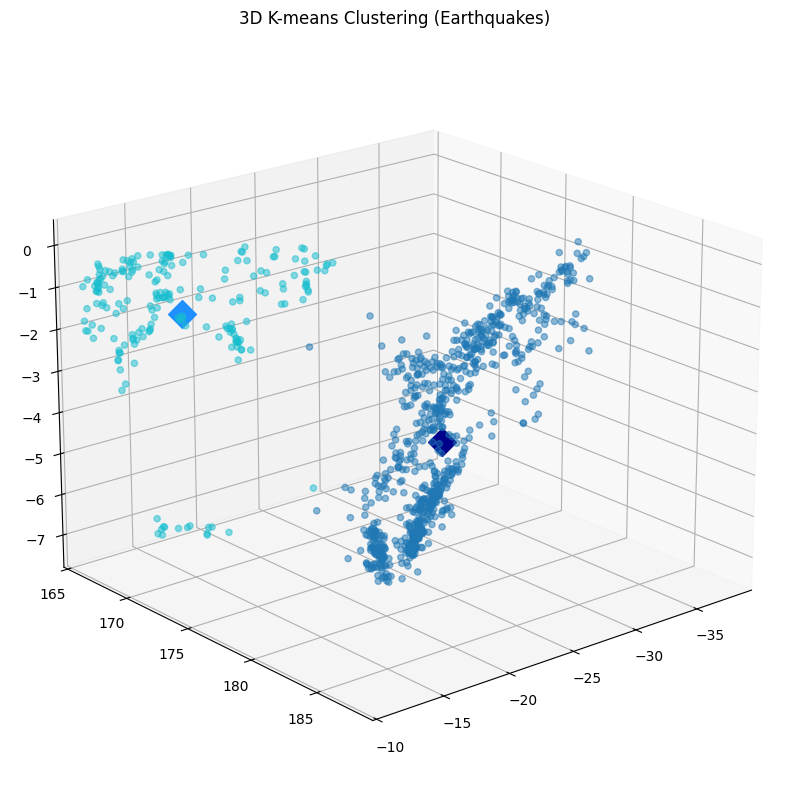

In [ ]:
# Create a 3d scatterplot of the clustered points

In [ ]:
# Choose k based on variability ratio

In [ ]:
# 2d and 3d scatterplot of the clustered points

## Earthquake dataset - Hierarchical Clustering

In [ ]:
# Load the quakes dataset from R via statsmodels
quakes = sm.datasets.get_rdataset("quakes", "datasets").data
Q = quakes.iloc[:, :2].copy()
Q['depth'] = -quakes.iloc[:, 2] / 100
print(Q)

       lat    long  depth
0   -20.42  181.62  -5.62
1   -20.62  181.03  -6.50
2   -26.00  184.10  -0.42
3   -17.97  181.66  -6.26
4   -20.42  181.96  -6.49
..     ...     ...    ...
995 -25.93  179.54  -4.70
996 -12.28  167.06  -2.48
997 -20.13  184.20  -2.44
998 -17.40  187.80  -0.40
999 -21.59  170.56  -1.65

[1000 rows x 3 columns]


In [ ]:
# Run Hierarchical Clustering with Single, Average, Complete and Ward linkage. Plot the dendograms.

Ward linkage choose the pair of clusters that once merged causes the smallest increase in WSS.

It avoids "chaining" seen in single linkage (where clusters can be stretched out).
It produces compact, spherical clusters.
It balances cluster sizes, unlike complete linkage, which might create clusters of very different sizes. It is more computational expensive.

In [ ]:
 # Compare hierarchical clustering with 2 and 3 clusters with all linkage methods, including ward

# Feedback

Please leave a feedback on this lab through [this form](https://forms.office.com/e/NisgK6E35M) (estimated 2 minutes)